In [2]:
suppressPackageStartupMessages({
    ## This is my custom library for various helper functions for spatial pre-processing 
    # devtools::install_github('korsunskylab/spatula', dependencies = FALSE)    
    # devtools::install_github('korsunskylab/spatula')

    library(lme4)
    library(furrr)
    library(future)
    library(arm)    
    library(harmony)
    library(uwot)
    library(singlecellmethods)
    library(sfarrow)
    library(igraph)
    library(geojsonsf)
    library(sf)    
    library(spatula)
    library(purrr)
    library(furrr)
    library(circlize)
    library(ComplexHeatmap)
    library(ggrepel)
    library(future)
    library(scales)
    library(glue)
    library(data.table)
    library(spatstat)
    library(tidyr)
    library(dplyr)
    library(data.table)
    library(presto)
    library(ggplot2)
    library(ggthemes)
    library(patchwork)
    library(Matrix)
})

fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}

## Clustering functions 
# source('../ModularityClustering/R/modularity_clustering.R')
# sourceCpp('../ModularityClustering/src/RModularityOptimizer.cpp')


source('utils_plotting.R')
source('utils.R')


readMM_fast <- function(fname, max_header_size = 100, nthreads = NULL) {
    ## First, figure out how many lines to skip
    ## Assumes that MM format has comments that start with %
    nlines_skip <- 0
    con <- file(fname, open = 'r')
    for (i in seq_len(max_header_size)) {
        line <- readLines(con, 1)
        nlines_skip <- nlines_skip + 1
        if (!grepl('^\\W*\\%', line)) {
            ## This is the line with dimension information 
            ## We need dimension information to handle empty rows and columns 
            nrow <- as.integer(strsplit(line, ' ')[[1]][1])
            ncol <- as.integer(strsplit(line, ' ')[[1]][2])
            break
        }
    }
    close(con)

    if (is.null(nthreads)) {
        nthreads <- data.table::getDTthreads()
    }
    ## Then, read the file and make a matrix 
    with(
        fread(fname, skip = nlines_skip, nThread = nthreads),
        Matrix::sparseMatrix(i = V1, j = V2, x = V3, dims = c(nrow, ncol))
    )
}


writeMM_fast <- function(X, fname) {
    stopifnot(is(X, 'dgCMatrix'))
    nelem <- length(X@i)
    nrow <- X@Dim[1]
    ncol <- X@Dim[2]    
    writeLines(paste0(c('%%MatrixMarket matrix coordinate real general\n', nrow, ' ', ncol, ' ', nelem), collapse = ''), fname)    
    fwrite(data.table(X@i+1, rep(seq_len(ncol), times = diff(X@p)), X@x), fname, append = TRUE, sep = ' ')        
}


source('../Clustering/cluster_utils.R')

# Data

In [19]:
meta_data <- fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells/meta_data.csv')
meta_data$cell <- as.character(meta_data$cell)
counts <- readMM_fast('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells/counts.mtx')
rownames(counts) <- readLines('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells/genes.txt')
colnames(counts) <- meta_data$cell
# clusters <- fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells/clusters.csv')
# clusters <- map(clusters, function(x) x = factor(x, unique(as.integer(x)))) %>% bind_cols()     
# U <- readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells/U.rds')
# U2 <- readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells/U2.rds')


In [20]:
head(meta_data)

cell,library,X,Y,ntx,ngene,nblank,hubID,hubSize_tiles,hubSize_um2,hubType,type_lvl1
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<chr>
1,Patient001,7086.414,79.414864,30,23,0,R686,66,165000,tumor,Epithelial
2,Patient001,7090.282,-74.397942,16,14,0,R490,233,542538,immune_other,Lymphocyte
3,Patient001,7087.515,-21.805606,15,12,1,R490,233,542538,immune_other,Epithelial
4,Patient001,7099.331,-17.703966,29,20,0,R490,233,542538,immune_other,Epithelial
5,Patient001,7100.477,-9.060024,29,16,1,R490,233,542538,immune_other,Epithelial
6,Patient001,7093.215,-5.783358,31,22,0,R490,233,542538,immune_other,Epithelial


In [21]:
table(meta_data$type_lvl1)
table(meta_data$type_lvl1 %in% c('Lymphocyte', 'Mast_Epi', 'Myeloid', 'Plasma'))
table(meta_data$type_lvl1 %in% c('Lymphocyte', 'Myeloid'))



Epithelial Fibroblast Lymphocyte   Mast_Epi    Myeloid     Plasma   Vascular 
    756179     186554     166657      46227     303126      44010      88588 


  FALSE    TRUE 
1031321  560020 


  FALSE    TRUE 
1121558  469783 

# Strategy 1: filter out non-immune relevant genes

Only focus on myeloid cells and lymphocytes. Mast and plasma don't need to be subset. 


## Select genes

In [22]:
head(meta_data)

cell,library,X,Y,ntx,ngene,nblank,hubID,hubSize_tiles,hubSize_um2,hubType,type_lvl1
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<chr>
1,Patient001,7086.414,79.414864,30,23,0,R686,66,165000,tumor,Epithelial
2,Patient001,7090.282,-74.397942,16,14,0,R490,233,542538,immune_other,Lymphocyte
3,Patient001,7087.515,-21.805606,15,12,1,R490,233,542538,immune_other,Epithelial
4,Patient001,7099.331,-17.703966,29,20,0,R490,233,542538,immune_other,Epithelial
5,Patient001,7100.477,-9.060024,29,16,1,R490,233,542538,immune_other,Epithelial
6,Patient001,7093.215,-5.783358,31,22,0,R490,233,542538,immune_other,Epithelial


In [23]:
markers_lvl1 = get_markers(counts, meta_data, 'type_lvl1')

CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"


Let's remove things that are definitely not in immune clusters. 

In [24]:
## Take the most extreme result in each 
stats_immune = data.table(markers_lvl1)[
    , .SD[cluster %in% c('Lymphocyte', 'Myeloid')][order(pvalue), ][1, ], by = feature
    # , .SD[cluster %in% c('Plasma', 'Mast_Epi', 'Lymphocyte', 'Myeloid')][order(pvalue), ][1, ], by = feature
] 

stats_non = data.table(markers_lvl1)[
    , .SD[!cluster %in% c('Lymphocyte', 'Myeloid')][order(pvalue), ][1, ], by = feature
    # , .SD[!cluster %in% c('Plasma', 'Mast_Epi', 'Lymphocyte', 'Myeloid')][order(pvalue), ][1, ], by = feature
]


In [25]:
full_join(stats_immune, stats_non, by = c('feature'), suffix = c('_immune', '_non')) %>% 
    subset(grepl('^COL\\d', feature))
    # subset(grepl('MUC|KRT', feature))


feature,cluster_immune,logFC_immune,SD_immune,zscore_immune,pvalue_immune,fdr_immune,cluster_non,logFC_non,SD_non,zscore_non,pvalue_non,fdr_non
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
COL1A2,Lymphocyte,-0.33963364,0.6806895,-0.4989553,0.6910946,0.9999801,Fibroblast,3.127241,0.6399828,4.886445,5.133647e-07,7.007477e-05
COL10A1,Lymphocyte,-0.09945244,0.8492067,-0.1171122,0.5466144,0.9999801,Fibroblast,3.207820,0.6819441,4.703934,1.275981e-06,1.009562e-04
COL4A1,Lymphocyte,-0.54573828,0.8950418,-0.6097350,0.7289813,0.9999801,Vascular,3.808152,0.9506407,4.005880,3.089352e-05,8.929826e-04
COL3A1,Lymphocyte,-0.10482780,0.7458636,-0.1405455,0.5558855,0.9999801,Fibroblast,2.755237,0.6888723,3.999634,3.172020e-05,9.013376e-04


In [26]:
length(unique(markers_lvl1$feature))

[1] 479

In [27]:
full_join(stats_immune, stats_non, by = c('feature'), suffix = c('_immune', '_non')) %>% 
    subset(feature %in% c('PDGFRB', 'PDGFRA', 'PECAM1'))

feature,cluster_immune,logFC_immune,SD_immune,zscore_immune,pvalue_immune,fdr_immune,cluster_non,logFC_non,SD_non,zscore_non,pvalue_non,fdr_non
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PECAM1,Lymphocyte,-0.1506468,0.5984322,-0.2517358,0.5993774,0.9999801,Plasma,1.957551,0.5346576,3.661317,0.0001254611,0.002431625
PDGFRA,Lymphocyte,-0.3175220,0.6590971,-0.4817530,0.6850093,0.9999801,Fibroblast,1.991381,0.5464292,3.644352,0.0001340330,0.002524790
PDGFRB,Lymphocyte,-0.4211006,0.8627124,-0.4881124,0.6872649,0.9999801,Vascular,3.142367,0.9457904,3.322477,0.0004461094,0.006181011


In [28]:
genes_remove = full_join(stats_immune, stats_non, by = c('feature'), suffix = c('_immune', '_non')) %>% 
    subset(zscore_non > 1.96 & zscore_immune < 0) %>% 
    with(feature)
length(genes_remove)    

genes_keep = setdiff(markers_lvl1$feature, genes_remove)
length(genes_keep)


[1] 186

[1] 293

In [29]:
## Check for contaminating genes 
grep('^COL|MUC|KRT|PECAM', genes_keep, value = TRUE)

# full_join(stats_immune, stats_non, by = c('feature'), suffix = c('_immune', '_non')) %>% 
#     subset(grepl('^MUC', feature))



[1] "MUC2"

In [30]:
# writeLines(sort(genes_remove))
# writeLines(sort(genes_keep))


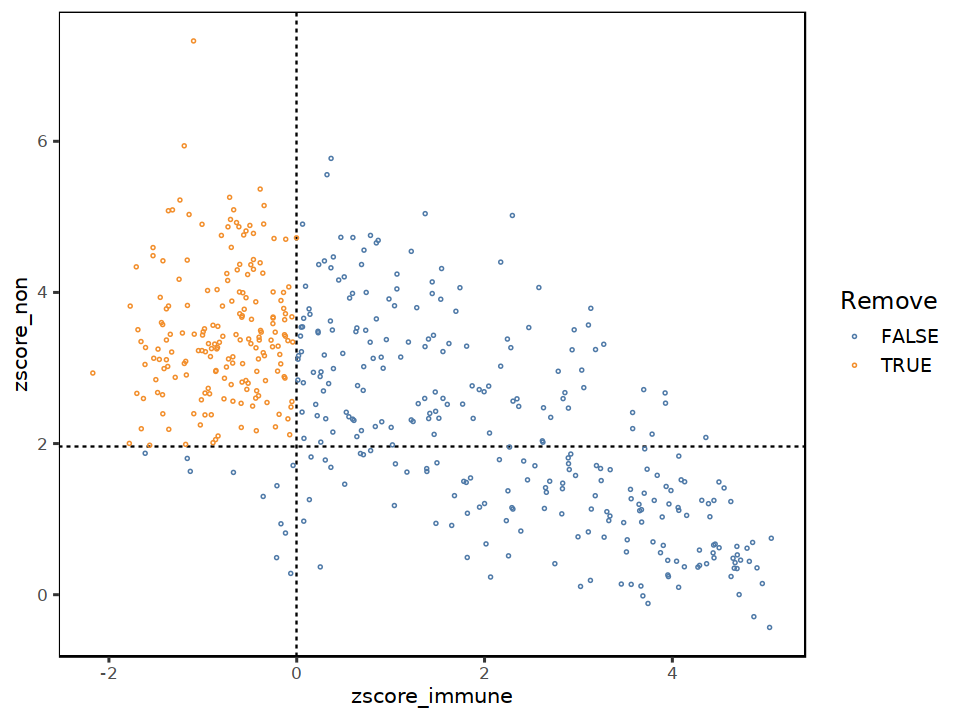

In [31]:
fig.size(6, 8)
full_join(stats_immune, stats_non, by = c('feature'), suffix = c('_immune', '_non')) %>% 
    # subset(pvalue_non < .2) %>% 
    # ggplot(aes(logFC_immune, logFC_non, color = feature %in% genes_remove)) + 
    ggplot(aes(zscore_immune, zscore_non, color = feature %in% genes_remove)) + 
        geom_hline(yintercept = 1.96, linetype = 2) + 
        geom_vline(xintercept = 0, linetype = 2) + 
        geom_point(shape = 21, size = .5) + 
        scale_color_tableau() + 
        labs(color = 'Remove') + 
        NULL


## Filter cells and genes

In [32]:
i = which(meta_data$type_lvl1 %in% c('Lymphocyte', 'Myeloid'))
length(i)
table(meta_data$type_lvl1[i])

[1] 469783


Lymphocyte    Myeloid 
    166657     303126 

In [33]:
counts_all = counts[, i] ## keep for marker analysis after clustering 
meta_data = meta_data[i, ]
counts = counts[genes_keep, i]


In [34]:
dim(meta_data)
dim(counts)
dim(counts_all)

[1] 469783     12

[1]    293 469783

[1]    479 469783

## re-QC

Lots of cells now have low counts (as low as 1) after selecting for genes. 


Warning message:
“Transformation introduced infinite values in continuous y-axis”


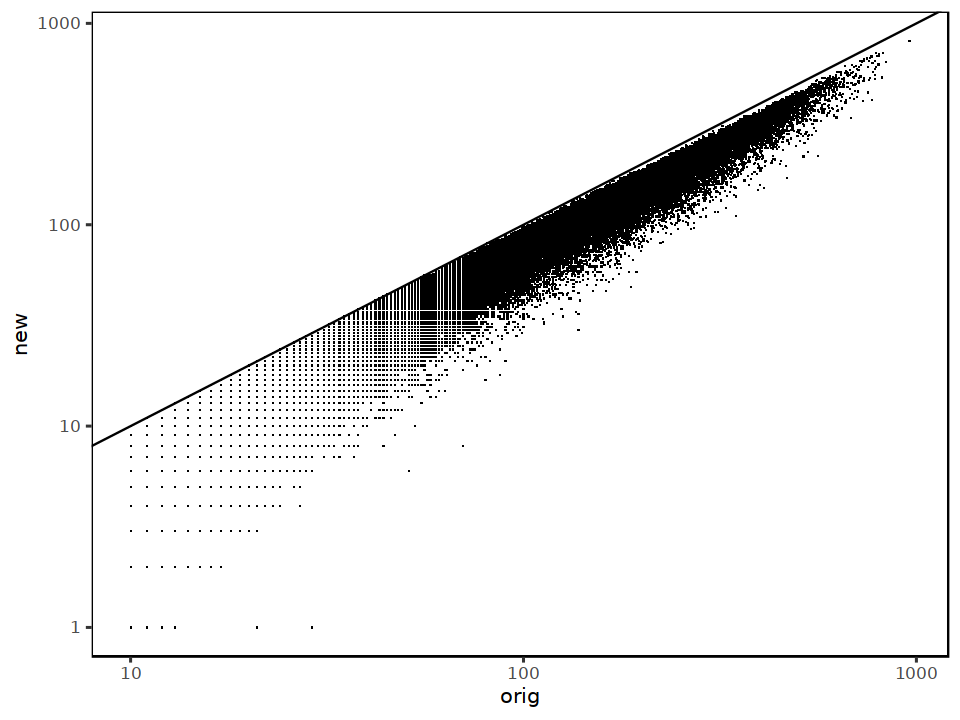

In [35]:
fig.size(6, 8)
tibble(orig = meta_data$ntx, new = colSums(counts)) %>% 
    ggplot(aes(orig, new)) + 
        geom_abline() + 
        geom_point(shape = '.') + 
        scale_x_log10() + 
        scale_y_log10() + 
        NULL


In [36]:
## almost 500 cells have fewer than 3 unique genes 
table(colSums(counts > 0) >= 3)

## 60,000 have fewer than 10 total transcripts 
table(colSums(counts) < 10)



 FALSE   TRUE 
   517 469266 


 FALSE   TRUE 
408596  61187 

In [37]:
i = which(colSums(counts) >= 10)
meta_data = meta_data[i, ]
counts = counts[, i]
counts_all = counts_all[, i]


In [38]:
dim(meta_data)
dim(counts)
dim(counts_all)

[1] 408596     12

[1]    293 408596

[1]    479 408596

## PCA

In [40]:
## 60,000 cells with fewer than 10 reads
table(colSums(counts) < 10)


 FALSE 
408596 

In [41]:
names(head(sort(colSums(counts_all))))

[1] "778"   "3340"  "3390"  "5659"  "8528"  "10138"

In [42]:
median(colSums(counts))

[1] 25

In [43]:
quantile(colSums(counts), c(.50, .75, .80, .95))

50% 75% 80% 95% 
 25  50  60 143

In [44]:
logcpx <- normalizeData(counts, median(colSums(counts)), 'log')
# logcpx <- normalizeData(counts, quantile(colSums(counts), .8), 'log')



In [45]:
y <- meta_data$library
weights <- as.numeric(((1/table(y))[y]) * (length(y)/length(unique(y))))
system.time({
    # pca_res <- weighted_pca(logcpx, weights, do_corr = TRUE, npc = 30)  
    pca_res <- weighted_pca(logcpx, weights, do_corr = FALSE)   
})


   user  system elapsed 
160.214  88.212  20.683 

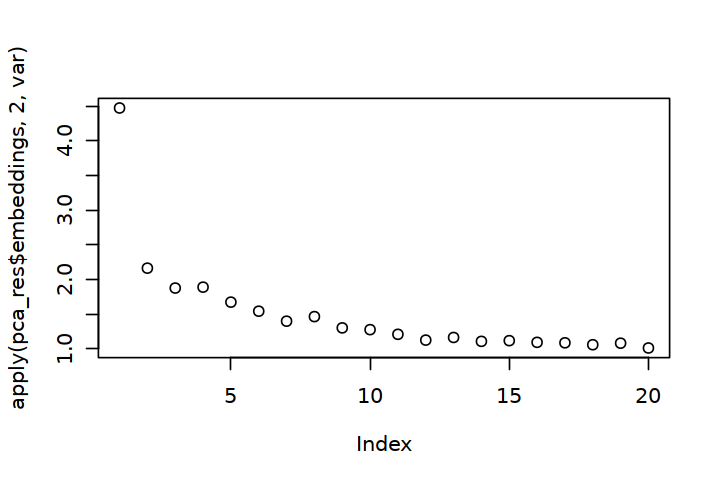

In [46]:
fig.size(4, 6)
plot(apply(pca_res$embeddings, 2, var))


Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


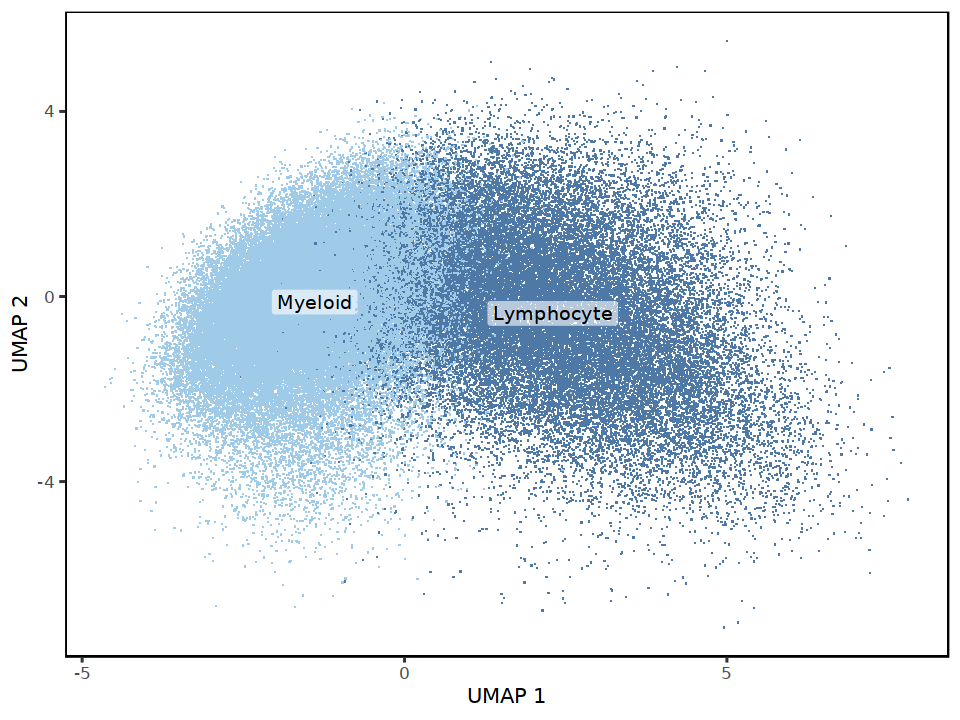

In [47]:
fig.size(6, 8)
i = sample(nrow(meta_data), 1e5)
do_scatter(pca_res$embeddings[i, ], meta_data[i, ], 'type_lvl1')


## Harmonize


use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 20429800)”
Harmony 1/5

Harmony 2/5

Harmony 3/5

Harmony 4/5

Harmony 5/5



     user    system   elapsed 
 9017.638 18732.932  2015.714 

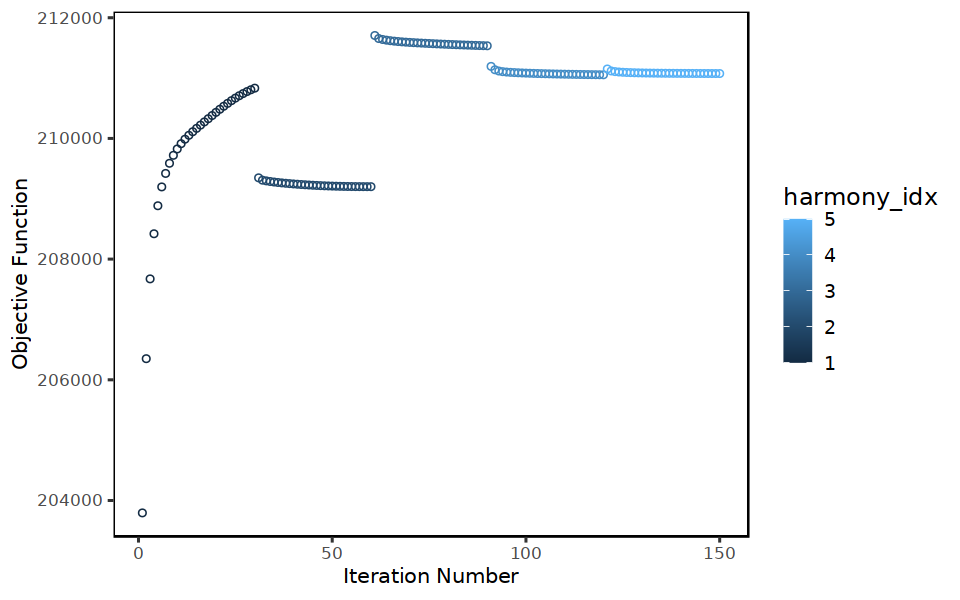

In [50]:
fig.size(5, 8)
system.time({
    harmony_res <- HarmonyMatrix(
        pca_res$embeddings, 
        meta_data, 'library', theta = 0, 
        do_pca = FALSE,
        # max.iter.harmony = 1, max.iter.cluster = 5, 
        max.iter.harmony = 5, max.iter.cluster = 30, 
        epsilon.cluster = -Inf, epsilon.harmony = -Inf, plot_convergence = TRUE, 
        return_object = TRUE
    )    
})


In [51]:
system.time({
    U2 <- uwot::umap(
        t(harmony_res$Z_cos), min_dist = 0.01, spread = 0.22, 
        ret_extra = 'fgraph',
        approx_pow = TRUE, pcg_rand = FALSE, n_sgd_threads = 20
    )    
})


   user  system elapsed 
496.410   3.508  99.826 

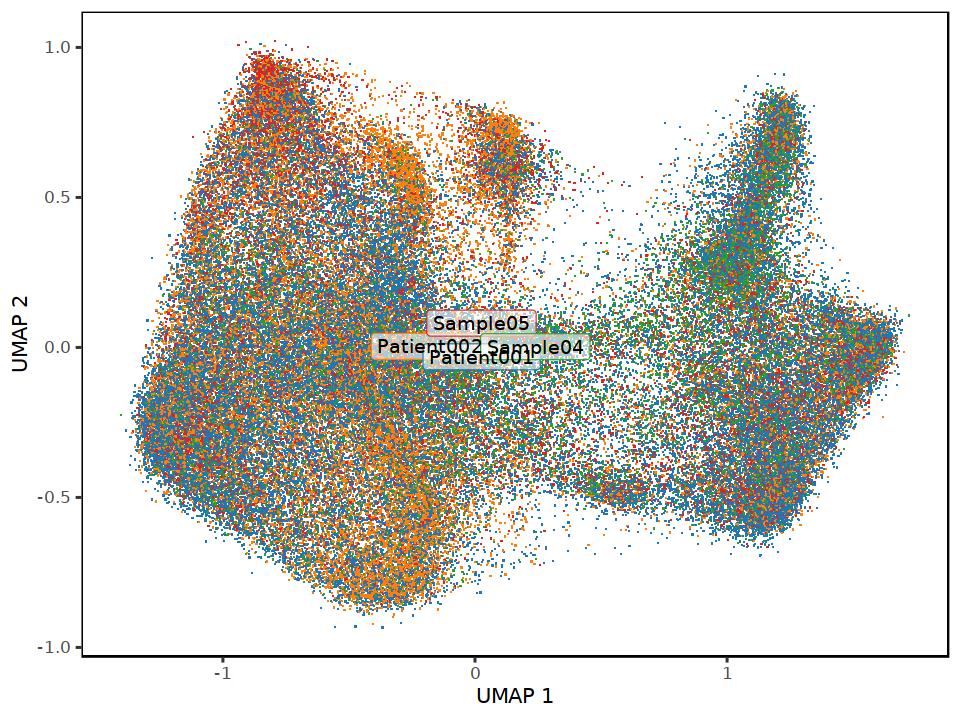

In [52]:
fig.size(6, 8)
i = sample(nrow(meta_data), 1e5)
do_scatter(U2$embedding[i, ], meta_data[i, ], 'library', palette_use = tableau_color_pal('Classic 10')(4))

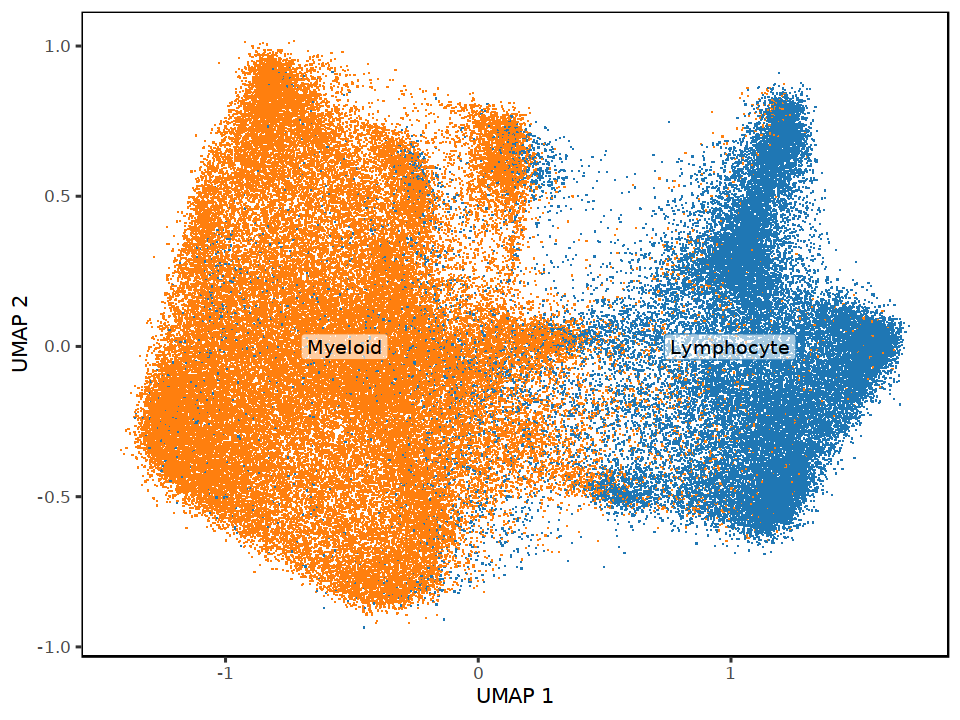

In [53]:
fig.size(6, 8)
i = sample(nrow(meta_data), 1e5)
do_scatter(U2$embedding[i, ], meta_data[i, ], 'type_lvl1', palette_use = tableau_color_pal('Classic 10')(10))


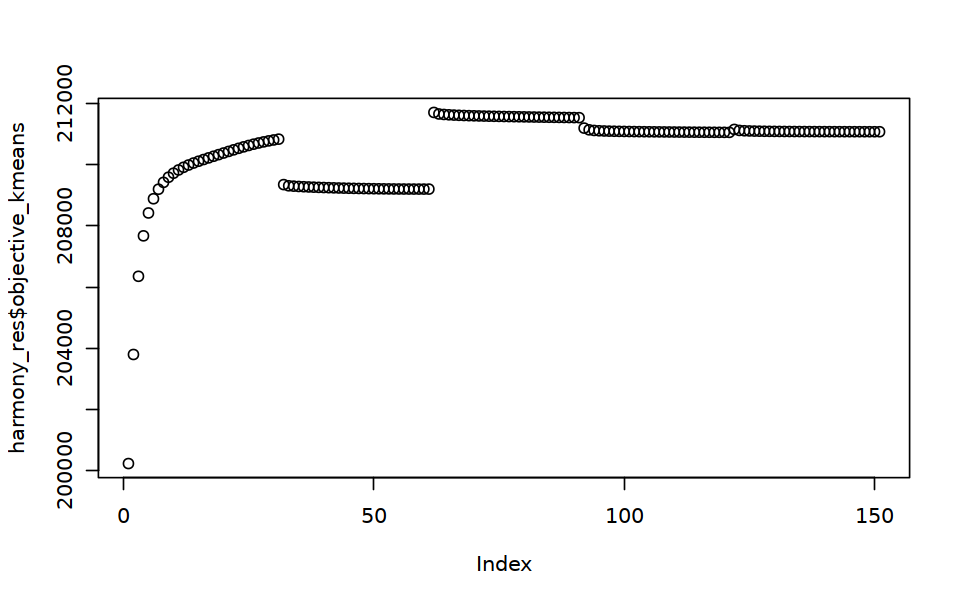

In [54]:
fig.size(5, 8)
plot(harmony_res$objective_kmeans)

In [55]:
# system.time({
#     ## Run umap with 0 epochs to return the unpruned input graph 
#     U2_fgraph <- uwot::umap(
#         t(harmony_res$Z_cos),
#         min_dist = 0.01, spread = 0.22,
#         ret_extra = c('fgraph'), 
#         approx_pow = FALSE, pcg_rand = TRUE, n_sgd_threads = 20, 
#         n_epochs = 0
#     )$fgraph 
# })


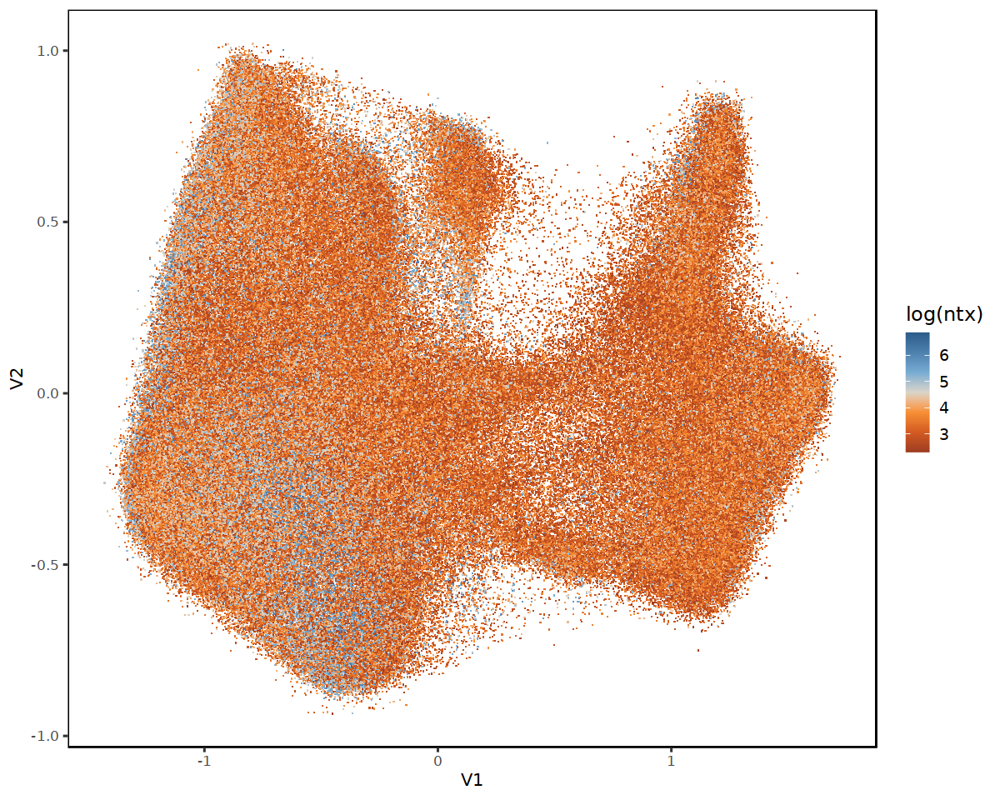

In [56]:
fig.size(8, 10)
U2$embedding %>% 
    data.table() %>% 
    cbind(meta_data) %>% 
    # dplyr::sample_n(5e4) %>% 
    ggplot(aes(V1, V2, color = log(ntx))) + 
        geom_point(shape = '.') + 
        scale_color_gradient2_tableau() + 
        NULL


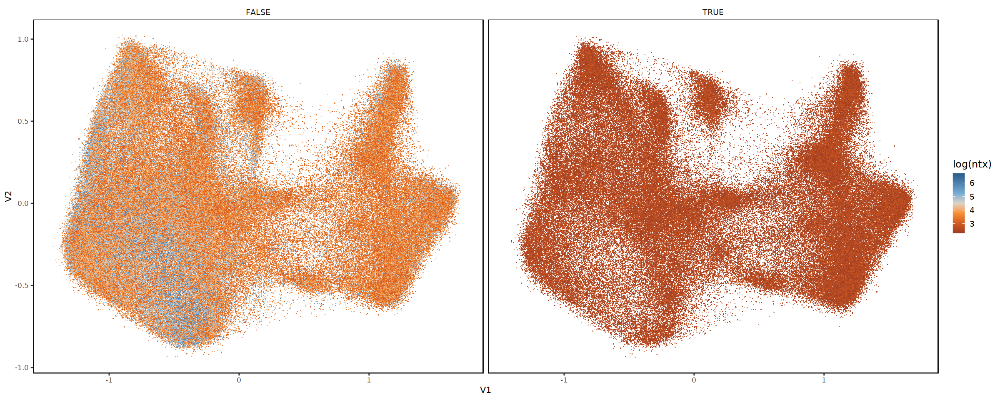

In [57]:
fig.size(8, 20)
U2$embedding %>% 
    data.table() %>% 
    # cbind(meta_data) %>% 
    cbind(ntx = colSums(counts)) %>% 
    # dplyr::sample_n(5e4) %>% 
    ggplot(aes(V1, V2, color = log(ntx))) + 
        geom_point(shape = '.') + 
        scale_color_gradient2_tableau() + 
        facet_wrap(~ntx < 20, nrow = 1) + 
        NULL


## Cluster

In [3]:
source('../Clustering/cluster_utils.R')

### Initial clustering

In [5]:
system.time({
x
    clusters_init = do_leiden_one(U2$fgraph, .8, 10, 3, TRUE)
})


1

best mod=0.754117909781596

2

best mod=0.759851390645709

3

best mod=0.761118401659532



   user  system elapsed 
528.507  36.244  95.836 

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


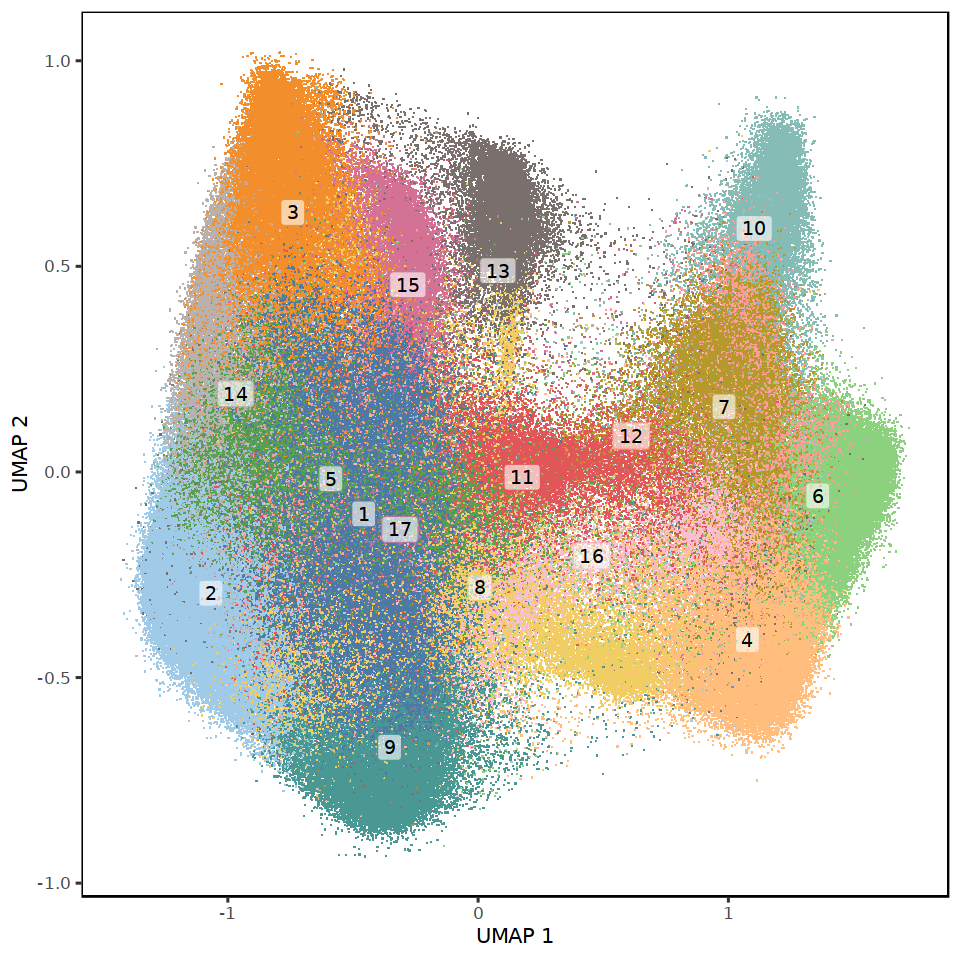

In [6]:
fig.size(8, 8)
do_scatter(U2$embedding, tibble(cluster = clusters_init), 'cluster')


In [7]:
table(clusters_init)

clusters_init
    1     2     3     4     5     6     7     8     9    10    11    12    13 
57948 40010 35587 33743 29577 28032 26470 22055 21943 19038 18034 17628 17009 
   14    15    16    17 
15889 13569  9024  3040 

In [8]:
markers <- get_markers(counts, cbind(meta_data, CLUSTER = clusters_init), 'CLUSTER')
markers$cluster <- factor(markers$cluster, levels(clusters_init))

CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"


In [9]:
tt(markers, logFC_min = .05, fdr_max = 1, n = 12)

1,MARCO,SERPINA1,MSR1,CA1,CXCL16,C1QB,LYZ,C1QC,C1QA,AXL,LY6E,ALOX5AP
2,IL18,MERTK,CSF3R,IL2RA,CSF2RA,LST1,MRC1,PLTP,CD163,NLRP3,FOLR2,CSF1R
3,MMP12,SPP1,GPNMB,Lyve1,ITLN1,IL7,MMP9,IL18RAP,VEGFA,APOE,IL1RN,CXCL8
4,CCR7,S1PR1,SELL,TNFRSF25,MS4A1,TCF7,KLF2,IL7R,CD40LG,CD19,CD247,CXCR5
5,FOLR2,CD14,IFNB1,CCL13,PLTP,TSLP,CSF1R,CCR6,C1QC,CD163,HLA-DRB1,HLA-DRA
6,FOXP3,CTLA4,CCR8,IKZF2,TNFRSF4,IL2RB,TRAC,TNFRSF25,BATF,CD27,TNFRSF1B,CCR4
7,LAG3,GZMK,GZMA,CD8A,EOMES,KLRG1,CST7,PRF1,CXCR6,CCL5,CCR5,FASLG
8,CCL22,CCL17,LAMP3,FSCN1,CD1C,CSF2RA,S100B,CCR7,LST1,FLT3,CSF2RB,IDO1
9,FCN1,CSF3R,S100A8,CA1,LYZ,S100A9,LST1,IL2,CTSG,FOS,ALOX5,HCK
10,GNLY,ZNF683,ITGAE,IL2RB,KIR2DL4,TRDC,FASLG,GZMA,CCL5,EOMES,PRF1,CXCR6
11,CXCL10,GBP1,CXCL11,IDO1,GBP4,CXCL9,CCL8,ISG15,IRF1,MX1,IL1B,SOD2


### Plot markers

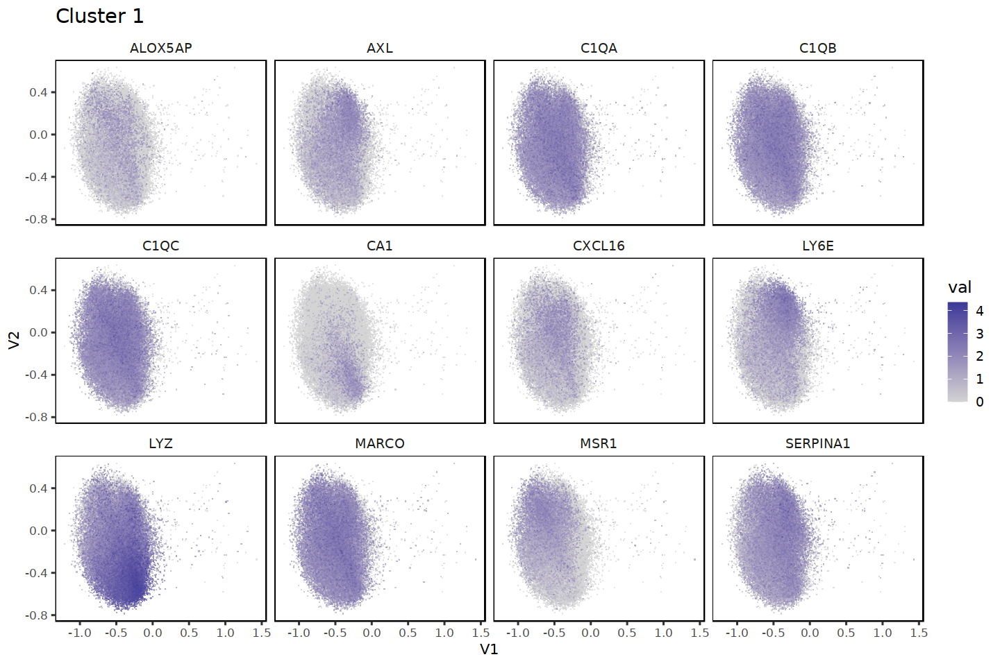

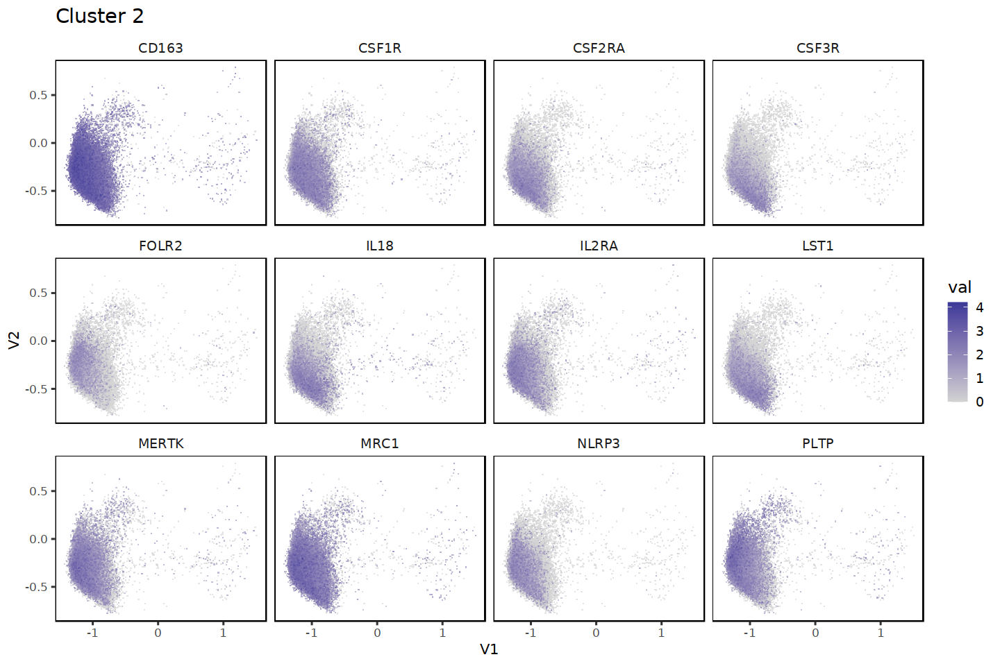

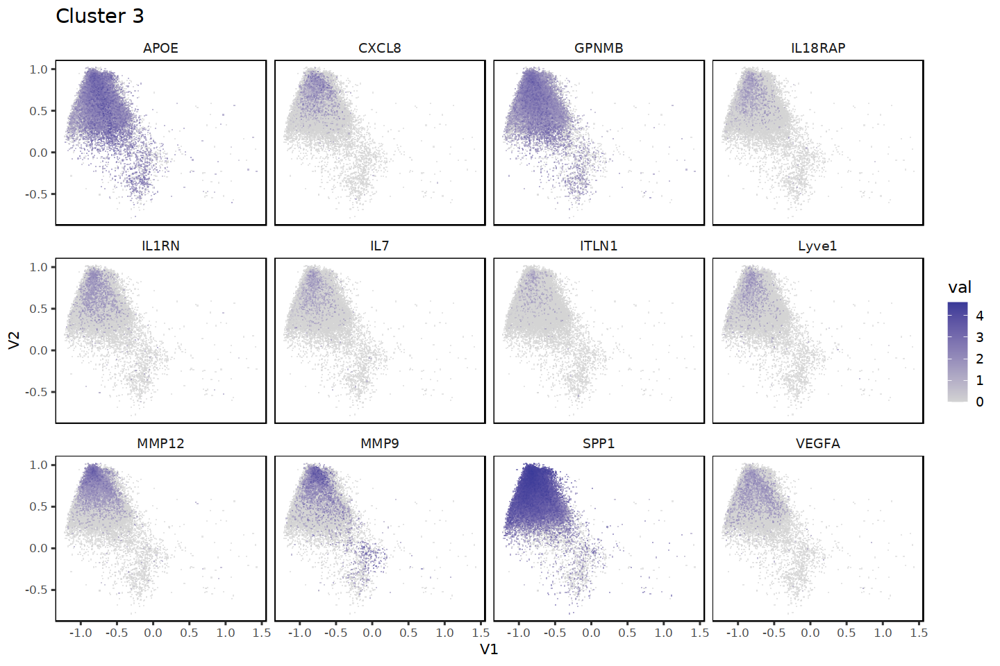

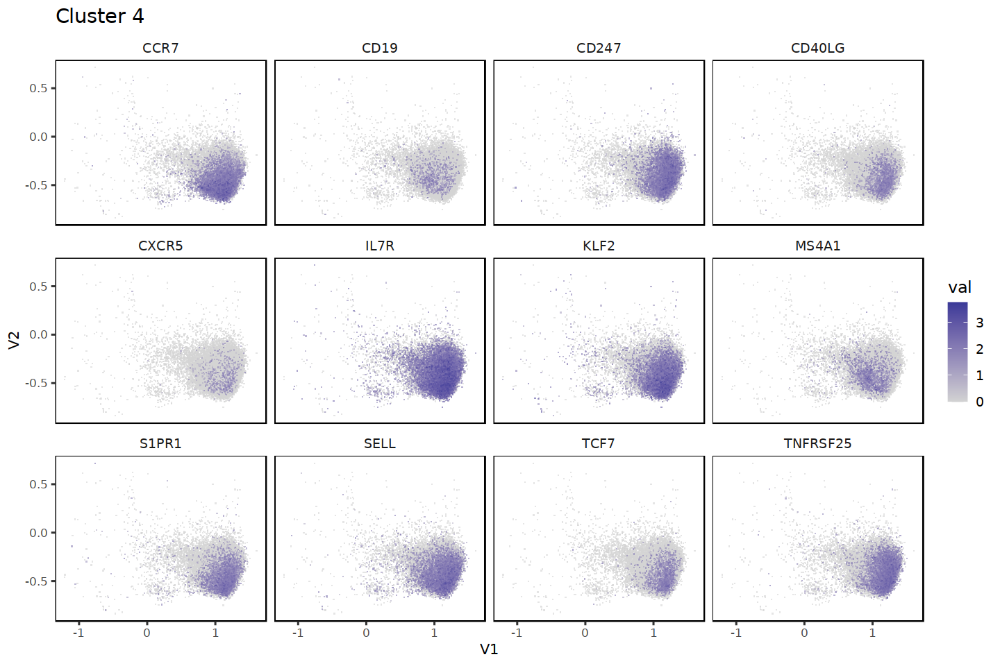

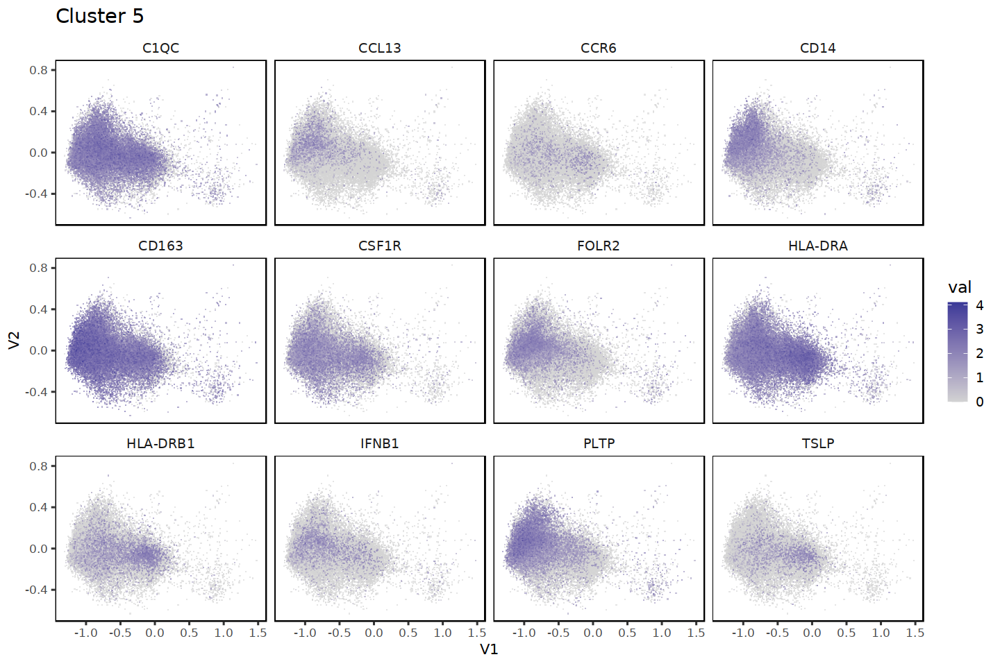

...

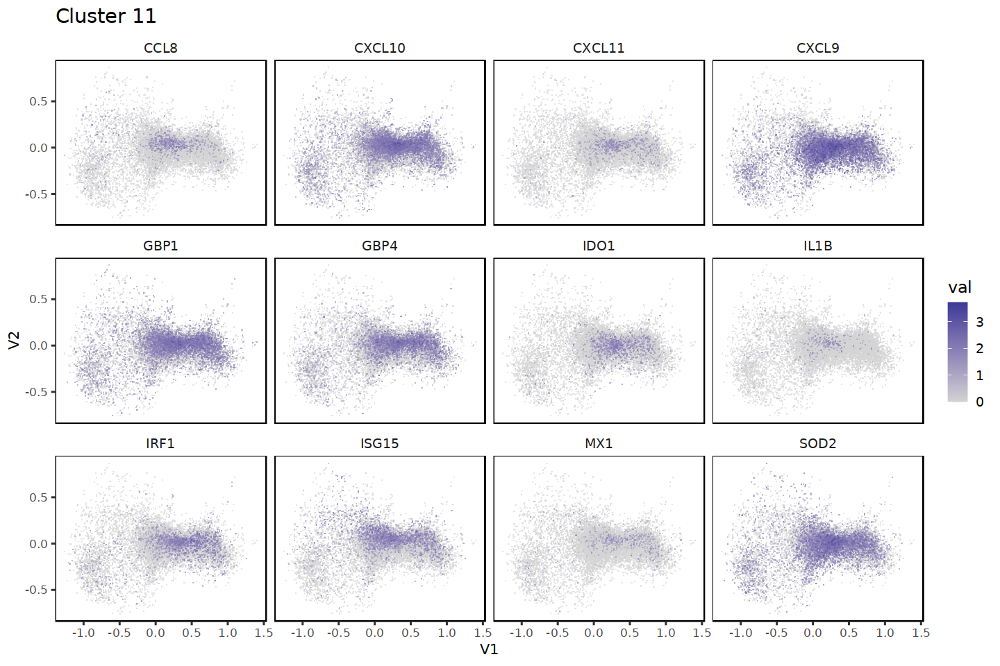

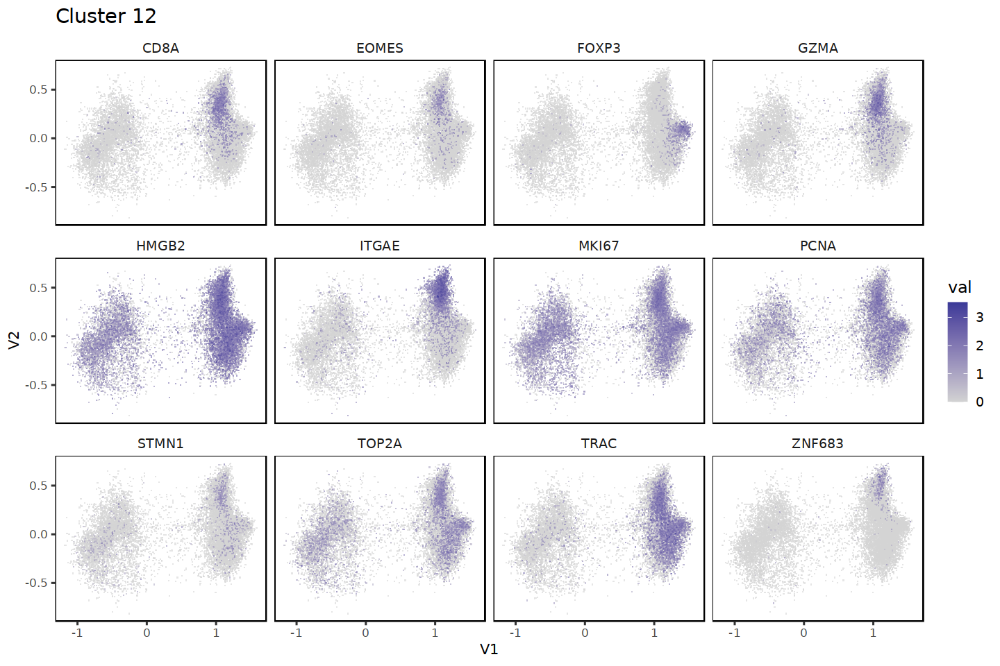

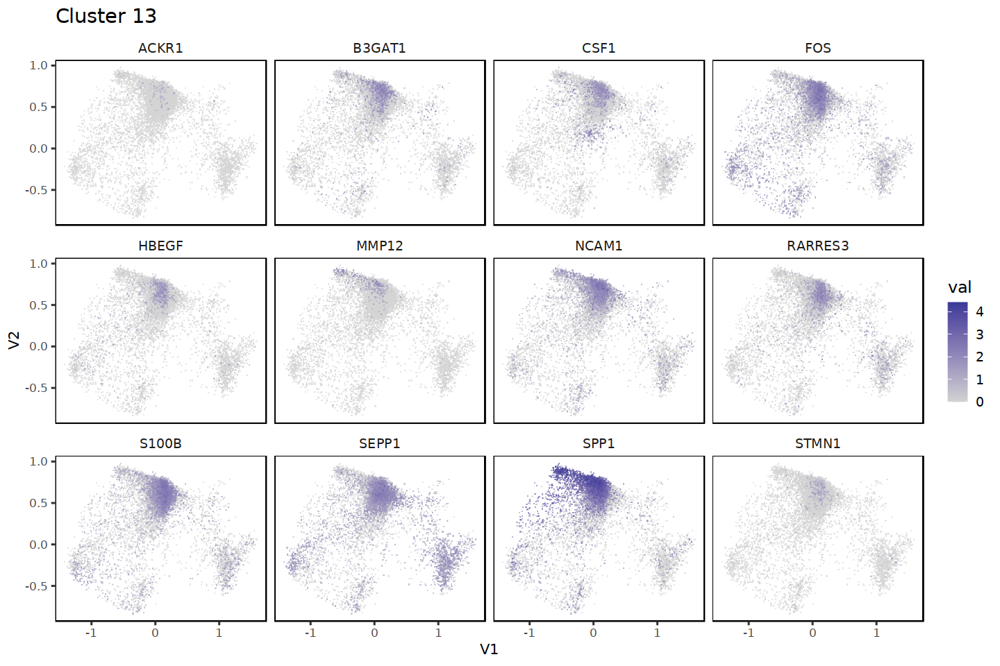

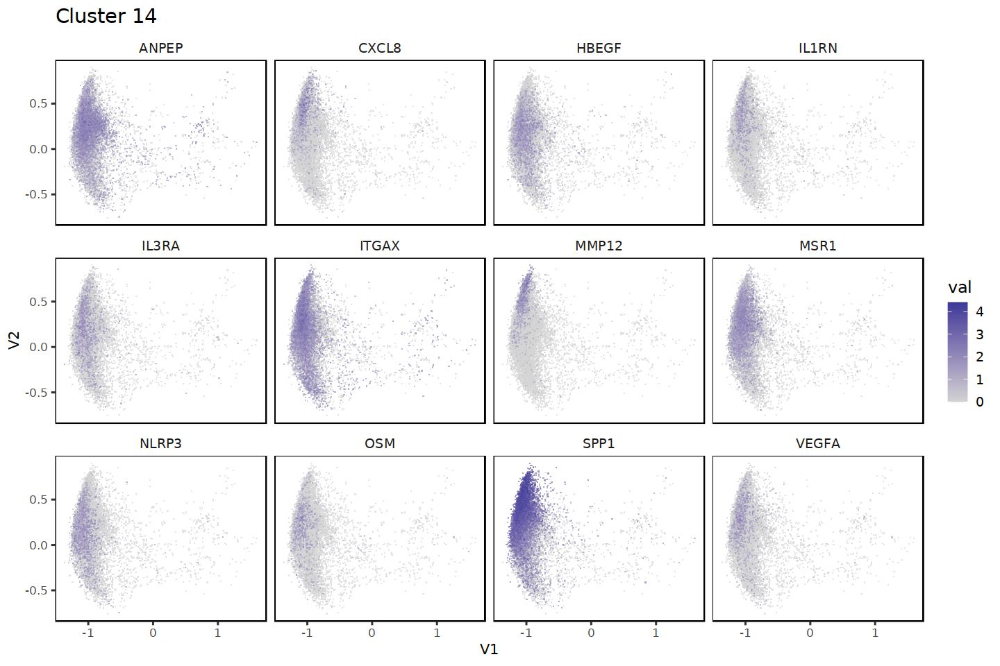

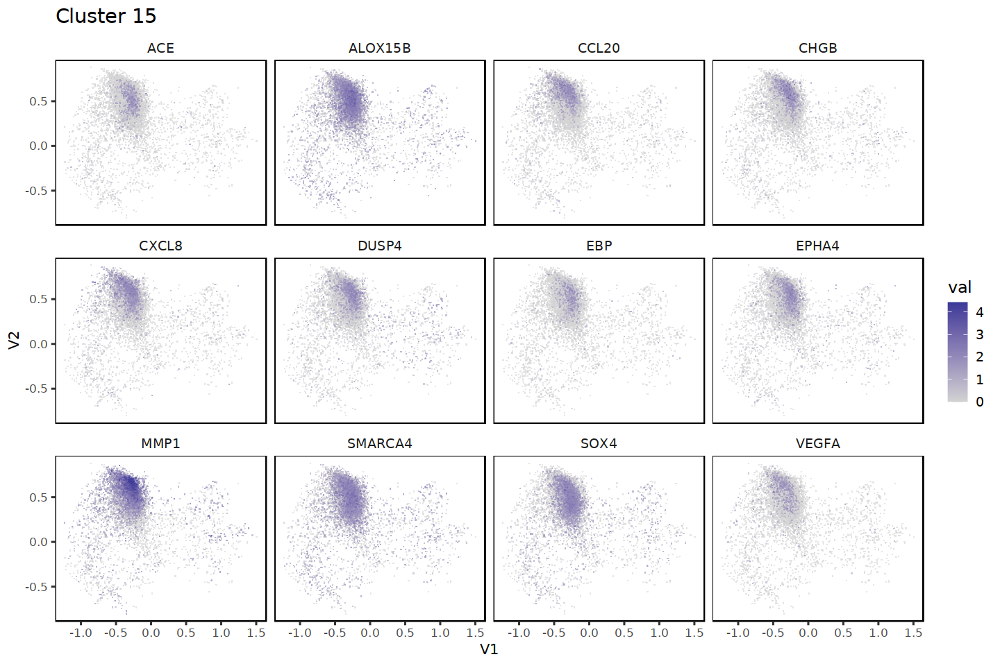

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]


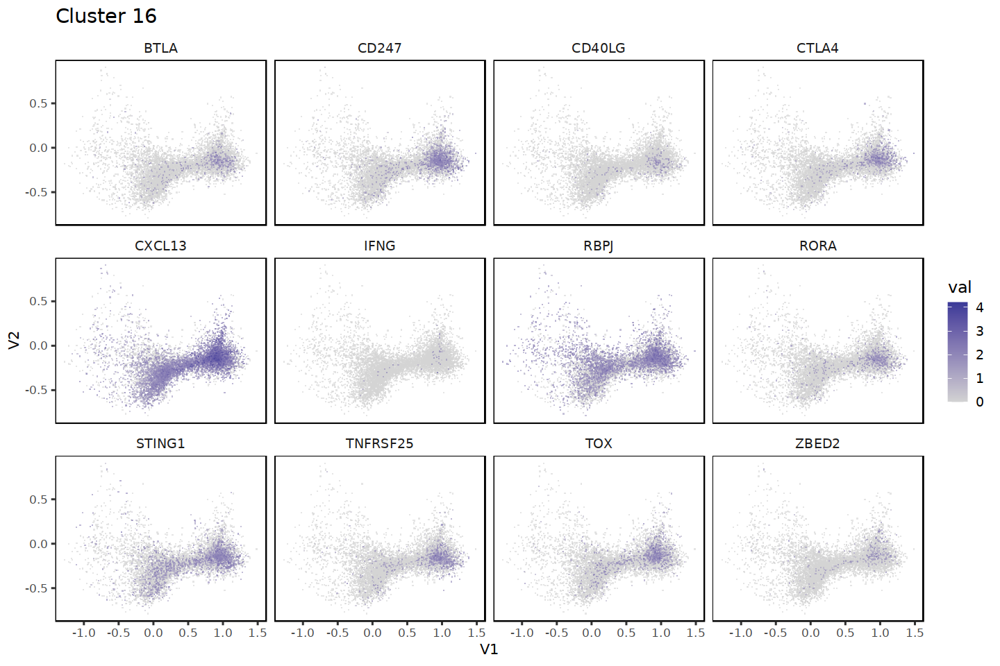

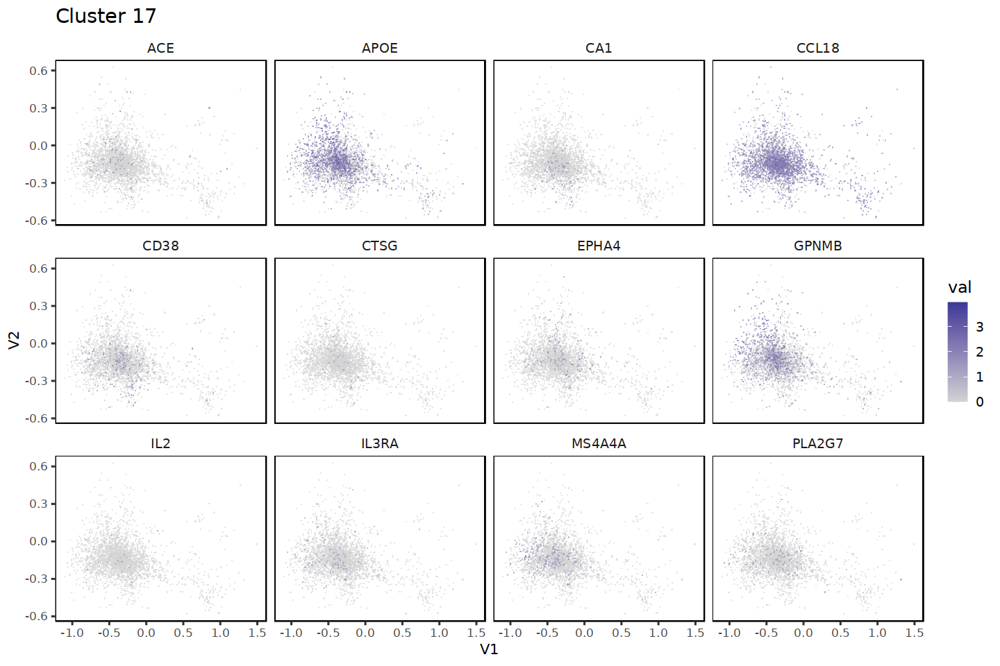

In [10]:
fig.size(8, 12)
map(levels(clusters_init), function(i) {
    plot_markers(na.omit(tt(markers, logFC_min = .05, fdr_max = 1, n = 12)[i, ]), clusters_init, i) + labs(title = glue('Cluster {i}'))
})


### Refine clusters (all)

In [11]:
clusters = clusters_init
for (cluster_level in levels(clusters_init)) {
    message(cluster_level)
    clusters <- split_clusters(clusters, cluster_level, U2$fgraph, 0.6, 10, 1, FALSE, min_size = 100)
}


1

2

3

4

5

6

7

8

9

10

11

12

13

14

15

16

17



In [12]:
head(clusters)

[1] 4_3 1_4 1_3 1_1 3_3 7_3
120 Levels: 1_1 1_2 1_3 1_4 1_5 1_6 1_7 2_1 2_2 2_3 2_4 2_5 2_6 2_7 3_1 ... 17_9

In [13]:
nlevels(clusters)
unique(data.table(final = as.character(clusters), init = as.character(clusters_init)))[, .N, by = init]


[1] 120

init,N
<chr>,<int>
4,18
1,31
3,11
7,9
11,8
15,5
12,15
5,15
2,7


In [14]:
## Only using genes used for immune cell analysis 
system.time({
    markers <- get_markers(counts, cbind(meta_data, CLUSTER = as.character(clusters)), 'CLUSTER')    
})


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"


   user  system elapsed 
552.846  59.631  39.209 

In [19]:
## Use all genes, even those filtered out as being "non-immune"
system.time({
    markers_all <- get_markers(counts_all, cbind(meta_data, CLUSTER = as.character(clusters)), 'CLUSTER') 
})


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"


   user  system elapsed 
804.696  24.145 170.204 

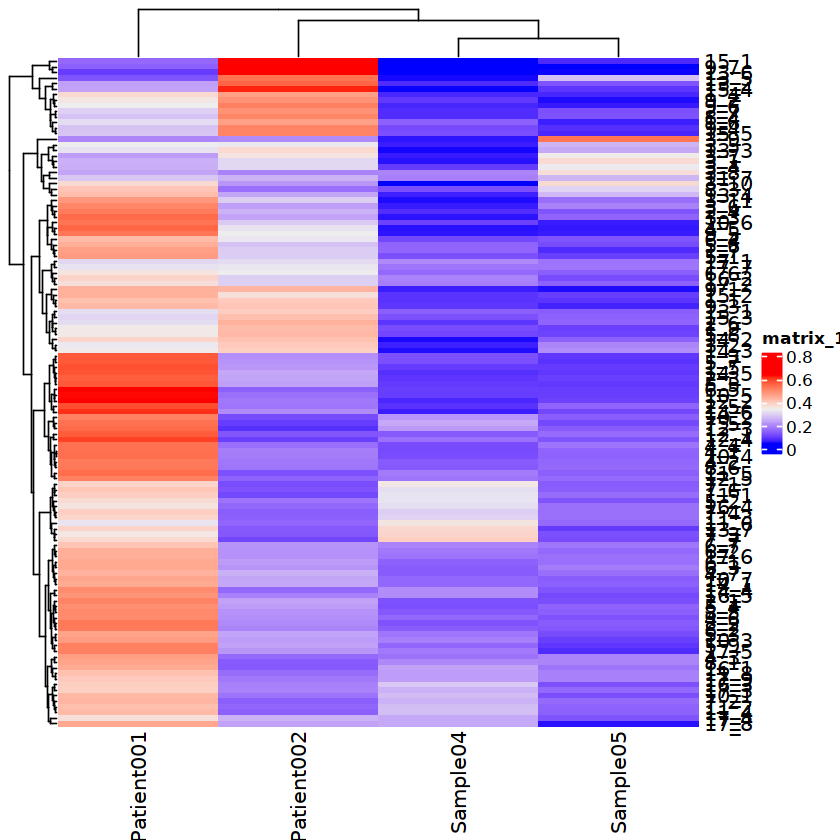

In [8]:
meta_data %>% 
    cbind(CLUSTER = clusters) %>% 
    with(table(CLUSTER, library)) %>%
    prop.table(1) %>% 
    Heatmap()


### Double check heterogeneity within subclusters

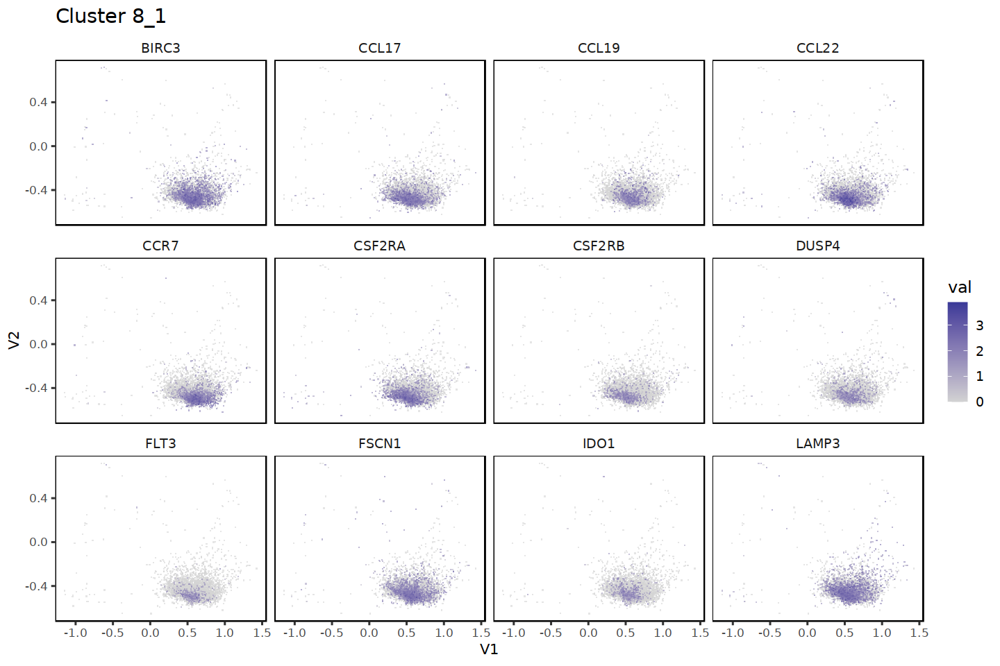

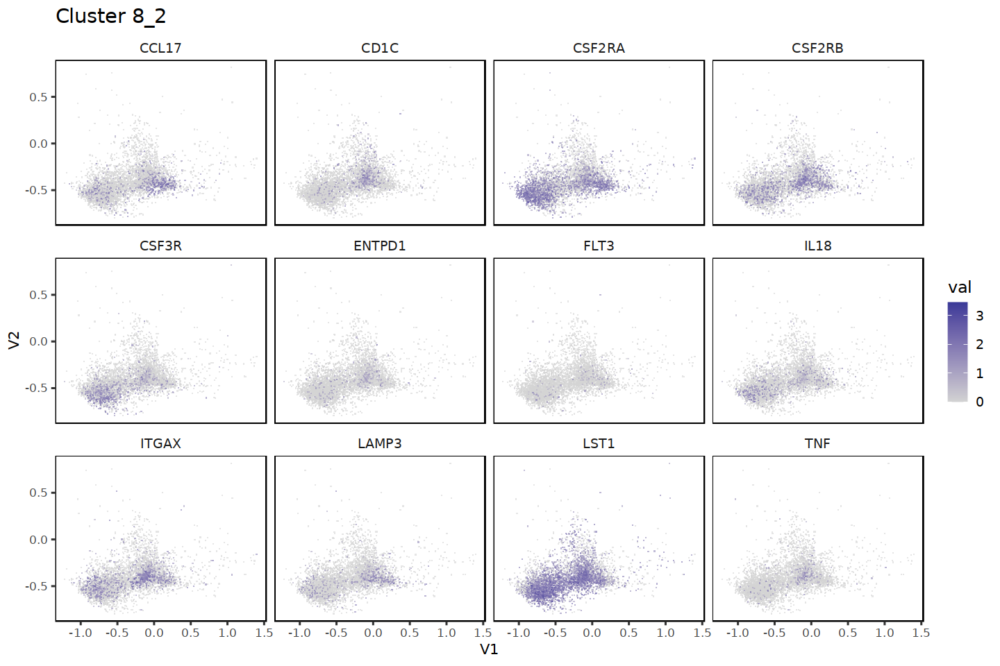

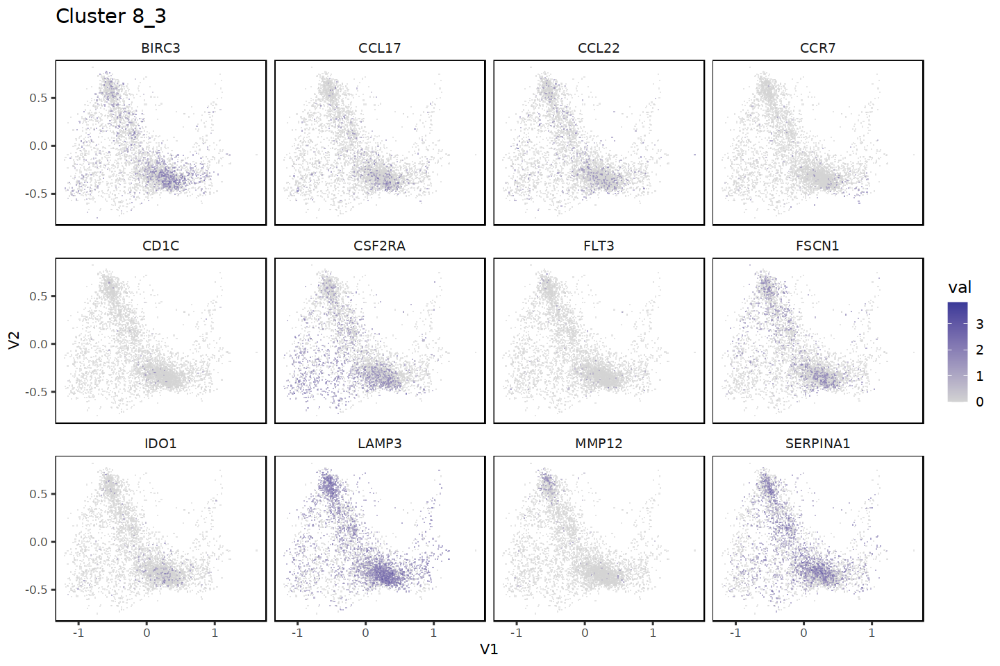

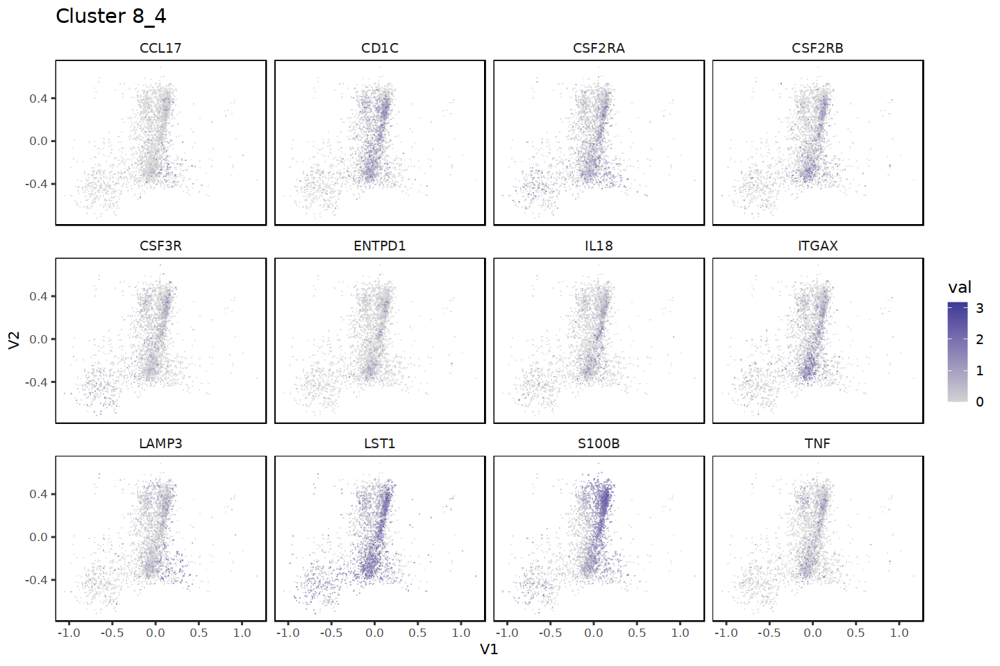

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]


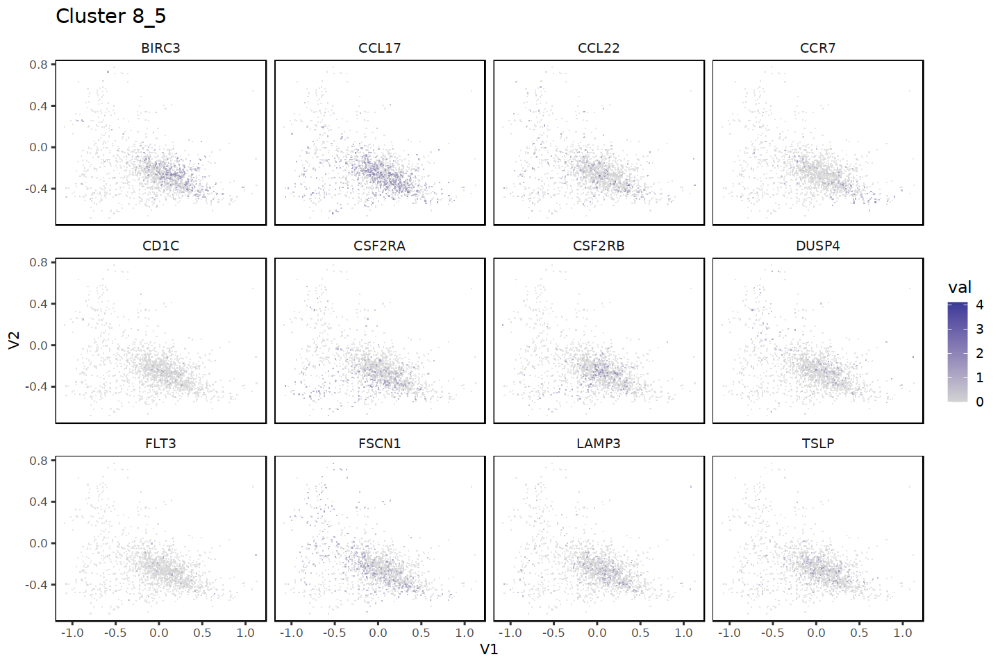

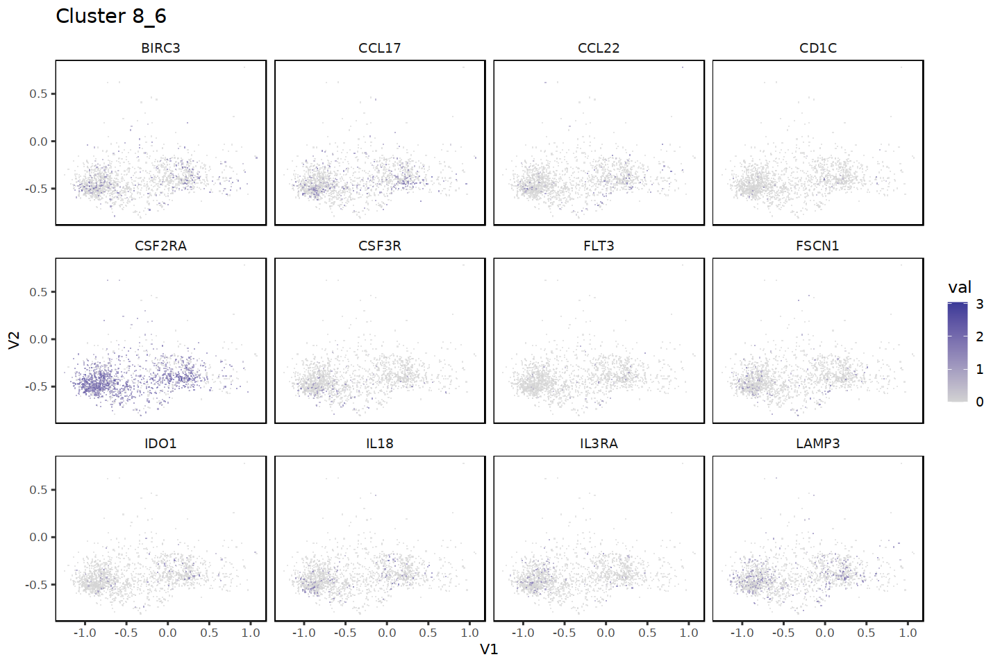

In [53]:
fig.size(8, 12)
map(grep('^8_', levels(clusters), value = TRUE), function(i) {
# map(levels(clusters_init), function(i) {
    plot_markers(na.omit(tt(markers, logFC_min = .05, fdr_max = 1, n = 12)[i, ]), clusters, i) + labs(title = glue('Cluster {i}'))
})


### Manually split some subclusters

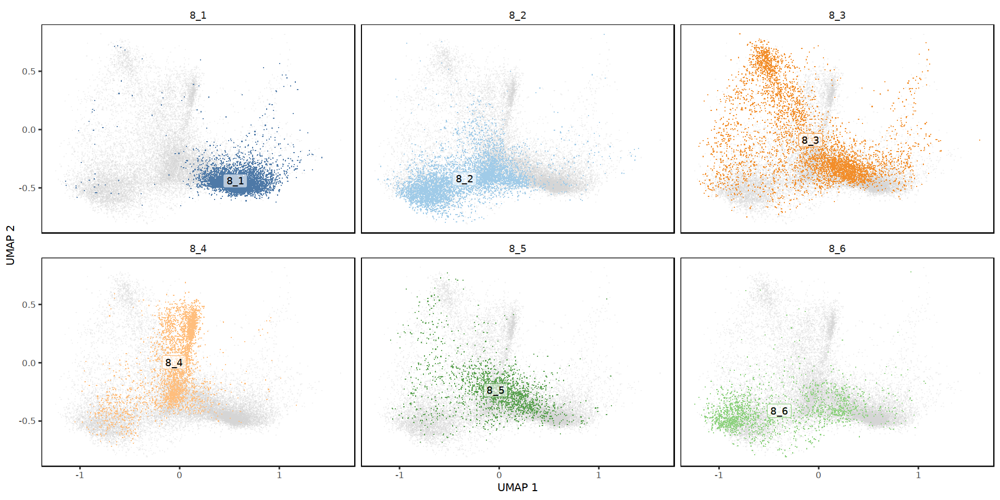

In [66]:
fig.size(8, 16)
i = grep('^8_', clusters)
do_scatter(U2$embedding[i, ], cbind(meta_data, CLUSTER = clusters)[i, ], 'CLUSTER', quo(CLUSTER), nrow = 2)


In [101]:
.clusters = clusters
.clusters = split_clusters(.clusters, '8_3', U2$fgraph, 0.3, 10, 3, FALSE, min_size = 1000)
table(.clusters)


Warning message in order(as.integer(gsub("^(.*)_.*$", "\\1", cluster_levels))):
“NAs introduced by coercion”


.clusters
  1_1   1_2   1_3   1_4   1_5   1_6   2_1   2_2   2_3   2_4   2_5   2_6   3_1 
18131 17553 11413  6066  5572  1090 12927  9331  9141  4124  3920  1523  7457 
  3_2   3_3   3_4   3_5   3_6   3_7   3_8   4_1   4_2   4_3   4_4   5_1   5_2 
 6985  5836  4322  3471  3366  3167  1638 10397 10276  8961  4185 11000  5541 
  5_3   5_4   5_5   5_6   6_1   6_2   6_3   6_4   6_5   6_6   7_1   7_2   7_3 
 5241  3699  2238  1859  7748  6958  6514  3808  1683  1665  8126  7484  4300 
  7_4   7_5   8_1   8_2   8_4   8_5   8_6   9_1   9_2   9_3   9_4   9_5  10_1 
 3506  2850  6080  5288  3241  1929  1706  6015  5935  4613  3153  2179  5175 
 10_2  10_3  10_4  10_5  10_6  11_1  11_2  11_3  11_4  11_5  12_1  12_2  12_3 
 4610  4637  2031  1421  1273  5359  4841  4563  1602  1600  5621  5317  4370 
 12_4  13_1  13_2  13_3  13_4  14_1  14_2  14_3  14_4  15_1  15_2  15_3  15_4 
 2404  5257  4972  4565  2112  5519  3399  3240  3340  4371  3323  3210  2971 
 16_1  16_2  16_3 8_3_1 8_3_2 
 4229  2757

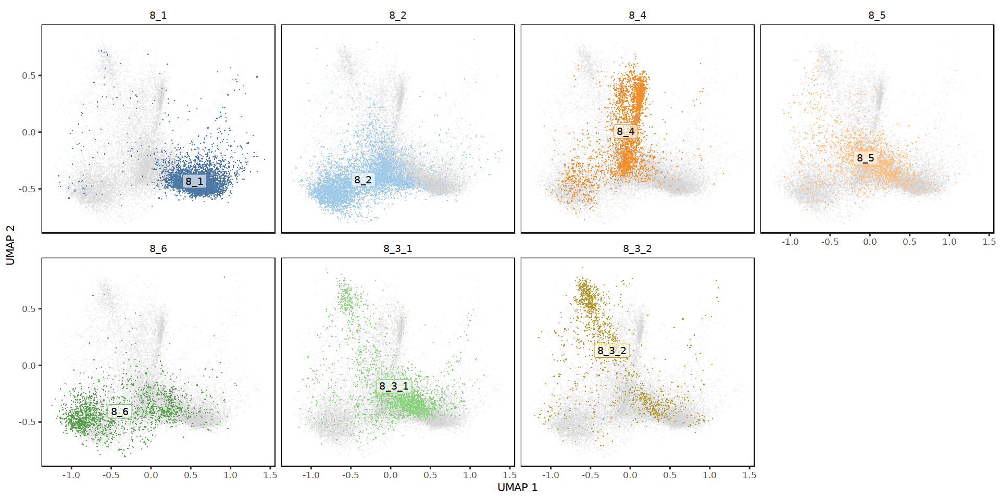

In [102]:
fig.size(8, 16)
i = grep('^8_', .clusters)
do_scatter(U2$embedding[i, ], cbind(meta_data, CLUSTER = .clusters)[i, ], 'CLUSTER', quo(CLUSTER), nrow = 2)


In [103]:
## Does splitting 8_3 work? 
system.time({
    .markers <- get_markers(counts, cbind(meta_data, CLUSTER = as.character(.clusters)), 'CLUSTER')    
})


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"


   user  system elapsed 
457.401  18.990  97.636 

In [104]:
tt(.markers, n=15, logFC_min = 0, fdr_max = .2)[grep('^8_', levels(.clusters), value = TRUE), ]

8_1,CCL22,CCR7,CCL17,LAMP3,FSCN1,FLT3,BIRC3,CSF2RA,IDO1,CCL19,CSF2RB,IL12B,TNFSF4,IL15,IL7R
8_2,LST1,CD1C,CCL17,CSF2RA,ITGAX,CSF2RB,CSF3R,IL18,TNF,ENTPD1,FLT3,LAMP3,SIGLEC6,CSF1R,CCL22
8_4,S100B,CD1C,LST1,TNF,ITGAX,CSF2RB,ENTPD1,IFNGR1,WNT5A,CX3CR1,CSF1R,PTGS1,HCK,SIGLEC6,IL22RA2
8_5,CCL17,CCL22,FSCN1,FLT3,CSF2RB,TSLP,HLA-DRA,CD74,NA,NA,NA,NA,NA,NA,NA
8_6,CSF2RA,CCL17,CCL22,LAMP3,FLT3,IL18,FSCN1,IDO1,CSF3R,CD1C,IL3RA,BIRC3,IRF1,CCR7,CSF2RB
8_3_1,LAMP3,CCL22,FSCN1,CSF2RA,BIRC3,IDO1,SERPINA1,CCL19,HCK,HLA-DRA,SOD2,NA,NA,NA,NA
8_3_2,LAMP3,FSCN1,CCL22,MMP12,CSF2RA,BIRC3,SPP1,SERPINA1,HBEGF,S100A9,ALOX5AP,JUNB,NA,NA,NA


When we subcluster 8_3, we neither group 

In [119]:
.x = meta_data %>% cbind(CLUSTER = .clusters) %>% 
    with(table(CLUSTER, hubType)) %>% 
    prop.table(1)
.x[order(.x[, 'hybrid_hub']), 'hybrid_hub', drop = FALSE]


       hubType
CLUSTER hybrid_hub
  3_1   0.01408073
  14_2  0.01912327
  3_7   0.01957689
  3_3   0.02210418
  3_5   0.02304811
  3_2   0.02376521
  14_3  0.02438272
  15_1  0.02539465
  3_6   0.02852050
  1_1   0.03976615
  15_4  0.04846853
  1_3   0.05195829
  1_5   0.05222541
  1_4   0.05539070
  1_6   0.05688073
  3_4   0.06316520
  15_2  0.06470057
  13_2  0.07763475
  8_3_2 0.08220211
  5_5   0.08221626
  12_2  0.08256536
  2_4   0.08317168
  5_6   0.08552985
  13_3  0.08674699
  3_8   0.08730159
  1_2   0.08762035
  8_4   0.09163838
  14_4  0.09371257
  2_5   0.09872449
  5_4   0.10002703
  2_3   0.10108303
  10_6  0.10369207
  5_1   0.10700000
  15_3  0.11588785
  13_1  0.11888910
  5_3   0.11906125
  11_5  0.12125000
  2_6   0.12278398
  14_1  0.13245153
  6_5   0.13844326
  9_5   0.14869206
  2_2   0.15732505
  5_2   0.15881610
  8_3_1 0.16027280
  9_3   0.17017126
  9_2   0.17270430
  9_4   0.17285125
  11_4  0.17852684
  2_1   0.18209948
  10_3  0.18956222
  10_4  0.190546

In [11]:
table(meta_data$label)


                                   B               C1QC+ TSLP+ Macrophage 
                                8492                                10382 
                      CD1C+ITGAX+ DC                                CD4 T 
                                8326                                25654 
                               CD8 T                   CXCL10+ Macrophage 
                               22968                                18459 
                  CXCL13+ Macrophage                            CXCL13+ T 
                                4598                                 5014 
                      DC_Mac_doublet                 FCN1+LYZ+ Macrophage 
                                 227                                21952 
                            FLT3+ DC               FOLR2+CD14+ Macrophage 
                                3457                                19202 
                                GD T                       ITGAX+ Unknown 
                        

### subcluster QC 

In [9]:
library(ggridges)

### Pairwise scatter plots

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”


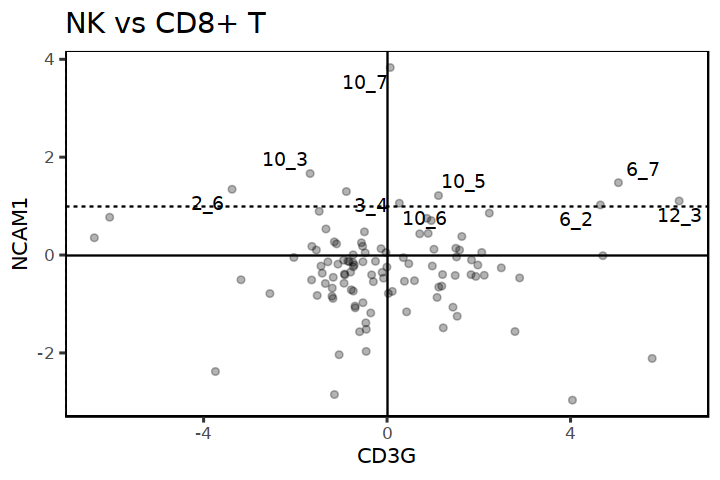

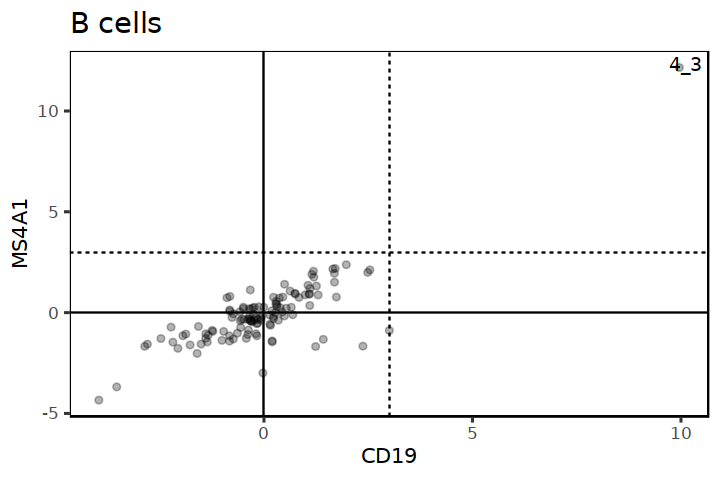

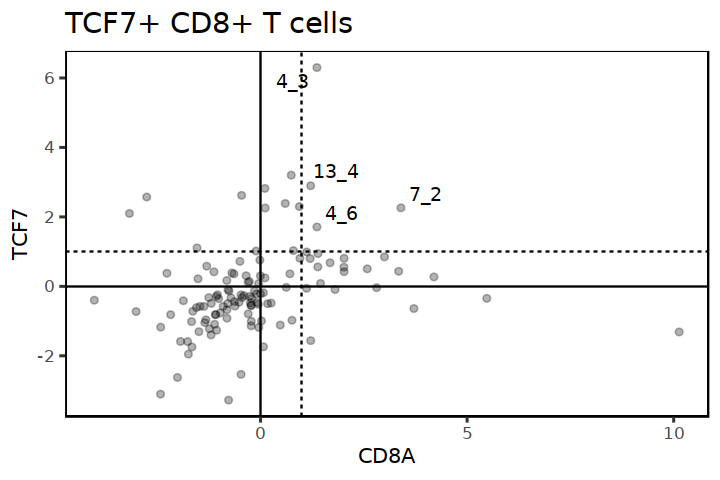

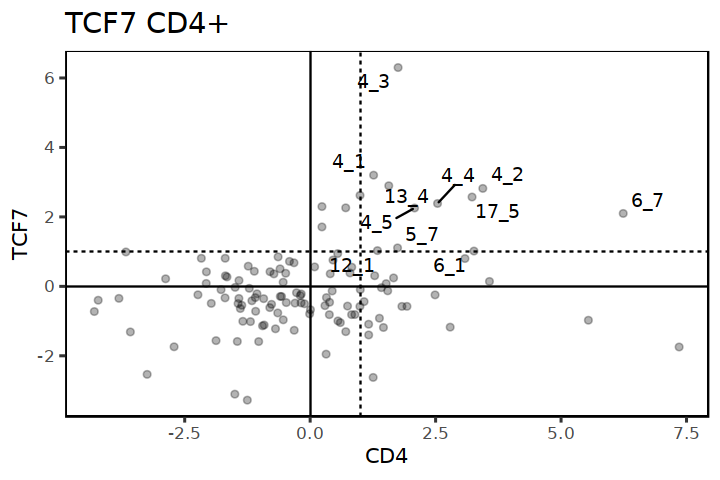

Warning message:
“ggrepel: 70 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


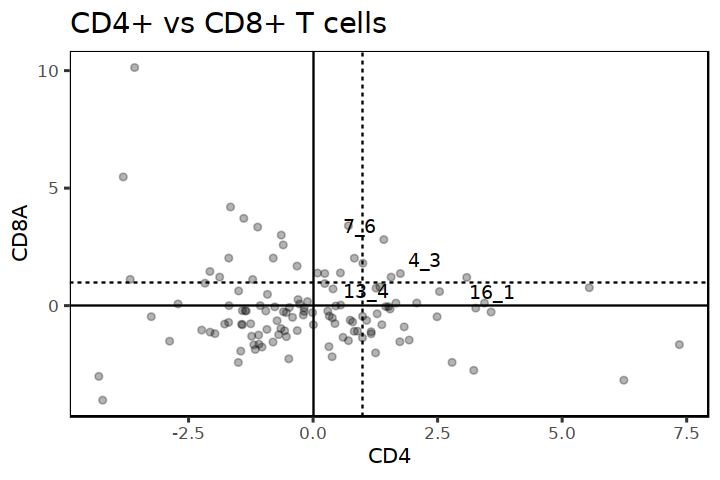

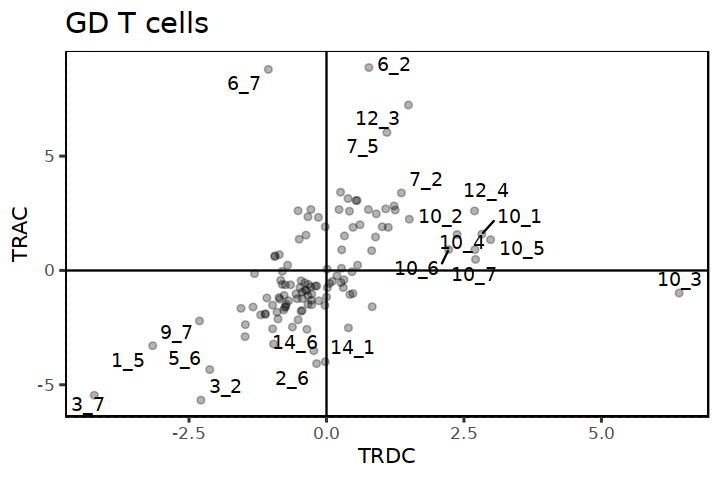

In [20]:
do_scatter_biv <- function(markers, g1, g2, t1=1, t2=1) {
    # g1 = 'CD8A'
    # g2 = 'TCF7'
    markers %>% 
        subset(feature %in% c(g1, g2)) %>%
        dplyr::select(cluster, feature, SCORE = zscore) %>% 
        tidyr::spread(feature, SCORE) %>% 
        ggplot(aes_string(g1, g2)) + 
            geom_point(
                alpha = .3
                # aes(color = gsub('(.*)_(.*)', '\\1', cluster))
            ) + 
            geom_text_repel(
                data = . %>% dplyr::filter(.data[[g1]] > t1 & .data[[g2]] > t2), 
                aes(label = cluster)
            ) + 
            geom_hline(yintercept = 0) + 
            geom_vline(xintercept = 0) + 
            geom_hline(yintercept = t2, linetype = 2) + 
            geom_vline(xintercept = t1, linetype = 2) + 
            NULL
}

fig.size(4, 6)
markers %>% 
    subset(!grepl('^13_|^9_', cluster)) %>% 
    do_scatter_biv('CD3G', 'NCAM1', -Inf, 1) + labs(title = 'NK vs CD8+ T')

markers %>% 
    do_scatter_biv('CD19', 'MS4A1', 3, 3) + labs(title = 'B cells')

markers %>% 
    do_scatter_biv('CD8A', 'TCF7', 1, 1) + labs(title = 'TCF7+ CD8+ T cells')

markers %>% 
    do_scatter_biv('CD4', 'TCF7', 1, 1) + labs(title = 'TCF7 CD4+')


markers %>% 
    do_scatter_biv('CD4', 'CD8A', 1, 1) + labs(title = 'CD4+ vs CD8+ T cells')


markers %>% 
    do_scatter_biv('TRDC', 'TRAC', -Inf, -Inf) + labs(title = 'GD T cells')


In [57]:
markers %>% 
    subset(cluster == '12_2') %>% 
    head(20)

cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
12_2,MKI67,5.2205885,1.6099842,3.242633,0.0005921523,0.01845751
12_2,TOP2A,3.4742924,1.2148306,2.859899,0.0021188824,0.05047419
12_2,HMGB2,2.3827660,0.9152883,2.603296,0.0046166155,0.09036105
12_2,PCNA,2.7468079,1.0556566,2.601990,0.0046342273,0.09052191
12_2,STMN1,1.8752002,0.7440506,2.520259,0.0058634278,0.10726229
12_2,PTTG1,1.0837560,0.6856369,1.580656,0.0569783719,0.49167470
12_2,FOS,1.1988331,0.7592238,1.579025,0.0571652095,0.49250889
12_2,TGFBI,0.8798806,0.5642580,1.559359,0.0594557382,0.50409061
12_2,CSF1R,1.1124173,0.7412971,1.500636,0.0667248395,0.54043892


In [53]:
table(grep('^12_', clusters, value = T))


12_1 12_2 12_3 12_4 12_5 
5429 5130 4263 2370  420 

In [67]:
# fwrite(markers, 'tables/markers_immune_subclusters.csv', sep = ',')

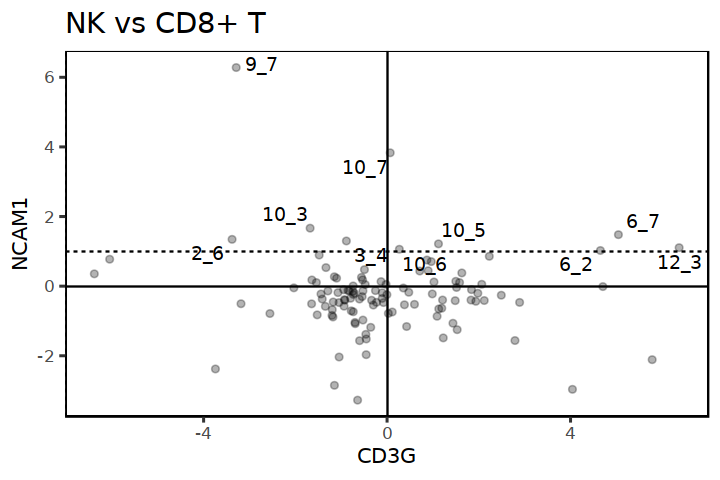

In [53]:
markers %>% 
    subset(!grepl('^13_', cluster)) %>% 
    do_scatter_biv('CD3G', 'NCAM1', -Inf, 1) + labs(title = 'NK vs CD8+ T')


In [18]:
grep('NOTCH', rownames(counts_all), value = TRUE)

[1] "NOTCH1" "NOTCH2" "NOTCH3" "NOTCH4"

Warning message:
“ggrepel: 96 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


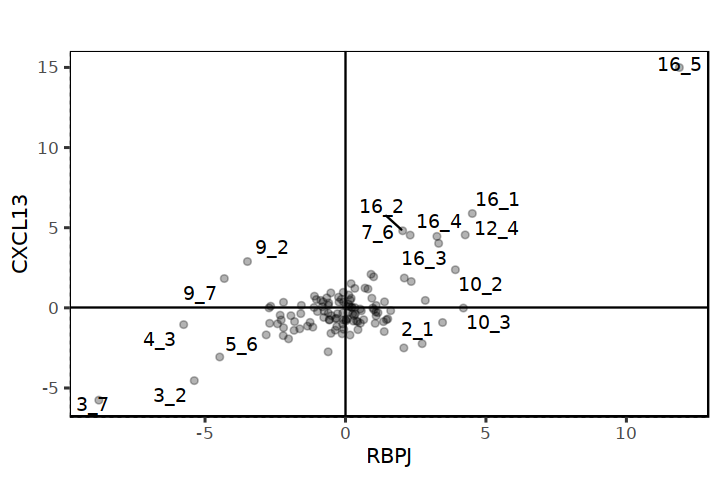

In [21]:
markers %>% 
    do_scatter_biv('RBPJ', 'CXCL13', -Inf, -Inf) + labs(title = '')


Warning message:
“ggrepel: 59 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


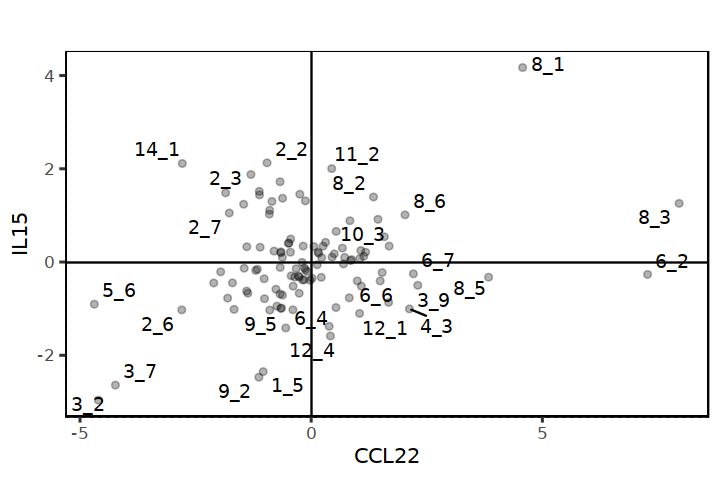

In [42]:
markers %>% 
    subset(!grepl('^13_', cluster)) %>% 
    do_scatter_biv('CCL22', 'IL15', -Inf, -Inf) + labs(title = '')


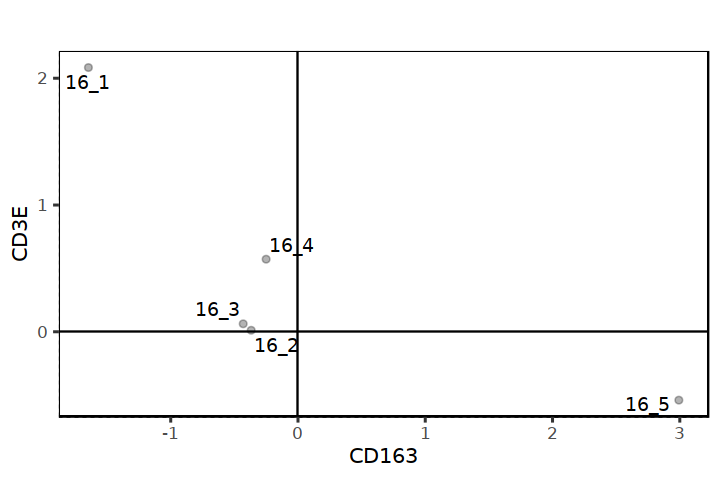

In [83]:
markers %>% 
    subset(grepl('^16_', cluster)) %>% 
    do_scatter_biv('CD163', 'CD3E', -Inf, -Inf) + labs(title = '')
    # do_scatter_biv('CD247', 'CD3G', -Inf, -Inf) + labs(title = '')


In [85]:
markers %>% 
    subset(feature == 'CXCL13' & fdr < .01)

cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
16_5,CXCL13,5.211125,0.3475989,14.991778,4.154951e-51,4.869603e-47
16_1,CXCL13,5.701815,0.9688009,5.885436,1.985036e-09,2.318733e-07
16_2,CXCL13,4.610702,0.9589376,4.808136,7.617200e-07,5.454598e-05
12_4,CXCL13,3.670942,0.8066998,4.550567,2.675075e-06,1.707103e-04
7_6,CXCL13,4.315989,0.9510181,4.538282,2.835713e-06,1.796462e-04
16_4,CXCL13,4.865497,1.0913562,4.458212,4.132315e-06,2.522231e-04
16_3,CXCL13,4.212015,1.0473223,4.021699,2.888995e-05,1.400685e-03


Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


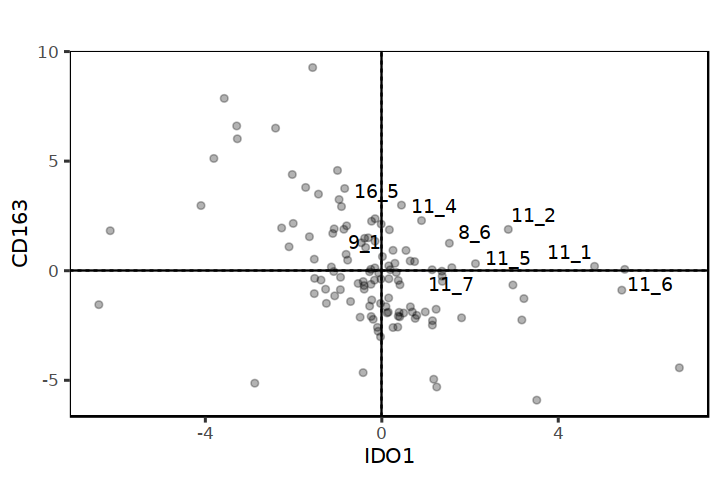

In [68]:
fig.size(4, 6)
# markers %>% 
#     do_scatter_biv('CD8A', 'CD8B', 1, 1) + labs(title = '')
markers %>% 
    # do_scatter_biv('CD3G', 'TRDC', 1, 1) + labs(title = '')
    do_scatter_biv('IDO1', 'CD163', 0, 0) + labs(title = '')
    # do_scatter_biv('CD8A', 'TRDC', 0, 0) + labs(title = '')
    # do_scatter_biv('LAG3', 'TCF7', -Inf, -Inf) + labs(title = '')


### Explore subcluster markers

In [36]:
X = markers %>% ## immune genes
# X = markers_all %>% ## all genes
    dplyr::select(cluster, feature, SCORE = zscore) %>% 
    # dplyr::select(cluster, feature, SCORE = logFC) %>% 
    tidyr::spread(cluster, SCORE) %>% 
    tibble::column_to_rownames('feature') %>% 
    as.matrix() %>% 
    t()



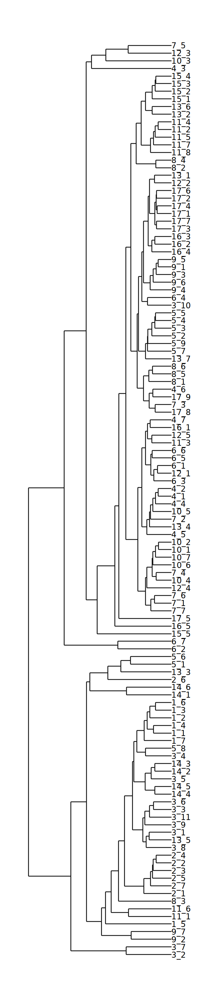

In [37]:
library(ggplot2)
library(ggdendro)

fig.size(25, 5)
hc = hclust(dist(X))

dendr <- dendro_data(hc, type="rectangle") 
ggplot() + 
    geom_segment(data=segment(dendr), aes(x=x, y=y, xend=xend, yend=yend)) + 
    geom_text(data=label(dendr), aes(x=x, y=y, label=label, hjust=0), size=5) +
    coord_flip() + 
    scale_y_reverse(expand=c(0.2, 0)) + 
    theme_void() 


In [38]:
clusters_ordered = rownames(X)[rev(hc$order)]
paste0(glue('"{clusters_ordered}", '), collapse = '')


[1] "\"7_5\", \"12_3\", \"10_3\", \"4_3\", \"15_4\", \"15_3\", \"15_2\", \"15_1\", \"13_6\", \"13_2\", \"11_4\", \"11_2\", \"11_5\", \"11_7\", \"11_8\", \"8_4\", \"8_2\", \"13_1\", \"12_2\", \"17_6\", \"17_2\", \"17_4\", \"17_1\", \"17_7\", \"17_3\", \"16_3\", \"16_2\", \"16_4\", \"9_5\", \"9_1\", \"9_3\", \"9_6\", \"9_4\", \"6_4\", \"3_10\", \"5_5\", \"5_4\", \"5_3\", \"5_2\", \"5_9\", \"5_7\", \"13_7\", \"8_6\", \"8_5\", \"8_1\", \"4_6\", \"17_9\", \"7_3\", \"17_8\", \"4_7\", \"16_1\", \"12_5\", \"11_3\", \"6_6\", \"6_5\", \"6_1\", \"12_1\", \"6_3\", \"4_2\", \"4_1\", \"4_4\", \"10_5\", \"7_2\", \"13_4\", \"4_5\", \"10_2\", \"10_1\", \"10_7\", \"10_6\", \"7_4\", \"10_4\", \"12_4\", \"7_6\", \"7_1\", \"7_7\", \"17_5\", \"16_5\", \"15_5\", \"6_7\", \"6_2\", \"5_6\", \"5_1\", \"13_3\", \"2_6\", \"14_6\", \"14_1\", \"1_6\", \"1_3\", \"1_2\", \"1_4\", \"1_1\", \"1_7\", \"5_8\", \"3_4\", \"14_3\", \"14_2\", \"3_5\", \"14_5\", \"14_4\", \"3_6\", \"3_3\", \"3_11\", \"3_9\", \"3_1\", \"13_5\", \"3_8\", \"2_4\", \"2_2\", \"2_3\", \"2_5\", \"2_7\", \"2_1\", \"8_3\", \"11_6\", \"11_1\", \"1_5\", \"9_7\", \"9_2\", \"3_7\", \"3_2\", "

In [39]:
# markers %>% 
#     subset(cluster %in% c('16_1', '16_5')) %>% 
#     # subset(cluster %in% c('16_2', '16_3', '16_4')) %>% 
#     subset(feature %in% c('BTLA', 'CD247', 'CTLA4'))

In [40]:
# (markers_all %>% 
#     subset(feature %in% setdiff(markers_all$feature, markers$feature)) %>% 
#     tt(fdr_max = .5, logFC_min = 0, n = 10))#[rownames(X)[rev(hc$order)], ]

In [47]:
markers %>% 
    subset(cluster %in% c('16_1', '16_5', '7_6')) %>% 
    subset(feature %in% c('CD8A', 'CD4', 'TRAC'))


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
16_5,CD4,1.1141577,0.1515276,7.352835,9.702315e-14,2.055020e-11
16_1,CD4,1.2020139,0.3896429,3.084911,1.018064e-03,2.854476e-02
7_6,CD8A,3.1981290,1.1382520,2.809684,2.479504e-03,5.697999e-02
7_6,TRAC,2.5113090,0.9327114,2.692482,3.546114e-03,7.524524e-02
16_1,TRAC,2.1591255,0.8098091,2.666215,3.835527e-03,7.984436e-02
16_5,TRAC,0.7462928,0.3014420,2.475742,6.647973e-03,1.179923e-01
7_6,CD4,0.5218865,0.3675079,1.420069,7.779385e-02,5.886017e-01
16_1,CD8A,0.8412547,0.7004583,1.201006,1.148744e-01,7.284012e-01
16_5,CD8A,-0.4565332,0.2749050,-1.660695,9.516126e-01,1.000000e+00


In [51]:
sum(grepl('^17_', clusters))

[1] 3042

In [59]:
markers %>% 
    subset(cluster == '12_4') %>% 
    arrange(-logFC)

cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
12_4,ZNF683,4.629899,1.4636130,3.163335,7.798630e-04,2.290725e-02
12_4,MKI67,4.594230,1.0478875,4.384278,5.818545e-06,3.438320e-04
12_4,ITGAE,4.419402,0.8043382,5.494458,1.959563e-08,1.929923e-06
12_4,CXCL13,3.670942,0.8066998,4.550567,2.675075e-06,1.707103e-04
12_4,GNLY,3.437986,1.3802303,2.490879,6.371379e-03,1.145285e-01
12_4,TOP2A,3.323373,0.9385707,3.540887,1.993922e-04,7.418656e-03
12_4,PCNA,3.135927,0.7069402,4.435916,4.584086e-06,2.769355e-04
12_4,HMGB2,2.988621,0.5597693,5.339023,4.672439e-08,4.323235e-06
12_4,GZMA,2.981289,0.7896548,3.775433,7.986497e-05,3.416122e-03


In [41]:
# tt(markers_all, fdr_max = .2, logFC_min = 0, n = 10)[rownames(X)[rev(hc$order)], ] %>% 
# tt(markers, fdr_max = .2, logFC_min = 0, n = 15)[c('8_1', '8_2', '8_3', '8_4', '8_5'), ] %>% 
tt(markers, fdr_max = .2, logFC_min = 0, n = 15)[rownames(X)[rev(hc$order)], ] %>% 
    data.frame() %>% 
    print(width = 5000)


           X1       X2       X3       X4       X5       X6       X7       X8       X9     X10      X11     X12      X13      X14      X15
7_5      LAG3     CD8A     GZMA     LY6E     CST7     GZMK    EOMES    CXCR6     PRF1    CCL5    FASLG   TBX21     CCR5      TOX    KLRG1
12_3    MKI67    TOP2A     GZMA     CD8A    EOMES     PCNA     LAG3     GZMK    FASLG    CCR5    HMGB2   ITGAE   ZNF683      TOX     CCL5
10_3     GNLY   ZNF683    ITGAE    IL2RB  KIR2DL4     TRDC    FASLG    EOMES     CCL5    GZMA    CD247   TRGC1     CLNK     PRF1    CXCR6
4_3     MS4A1     CD19     CCR7     SELL    S1PR1    CXCR5    CD79A     KLF2     TCF7    IL7R    CCL19   EPHA4    CXCR4     CCR4   CD40LG
15_4     MMP1  ALOX15B     CHGB     SOX4    CXCL8    CCL20      EBP   IFNGR2   IFNGR1 SMARCA4   TGFBR2    <NA>     <NA>     <NA>     <NA>
15_3  ALOX15B     MMP1     SOX4      ACE     CHGB    MERTK   PTGES2  SMARCA4     MMP9   PTGES   TGFBR2    <NA>     <NA>     <NA>     <NA>
15_2     SOX4  ALOX15B     MMP1  S

In [85]:
markers %>% 
    subset(fdr < .05 & feature %in% c('CCL22', 'LAMP3'))

cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8_3,LAMP3,4.608343,0.3621618,12.724543,2.159962e-37,4.746517e-34
8_3,CCL22,3.437199,0.4319382,7.957617,8.769221e-16,2.234245e-13
6_2,CCL22,2.734404,0.3758630,7.275003,1.732062e-13,3.520190e-11
3_9,LAMP3,4.065095,0.7030749,5.781880,3.693516e-09,4.122668e-07
8_1,CCL22,5.936530,1.2981497,4.573070,2.403147e-06,1.549775e-04
8_1,LAMP3,4.780778,1.2424536,3.847852,5.957897e-05,2.665136e-03
8_5,CCL22,3.746553,0.9764423,3.836943,6.228768e-05,2.761709e-03
6_2,LAMP3,1.183973,0.3259653,3.632204,1.405052e-04,5.550746e-03
4_7,LAMP3,2.700611,0.7868806,3.432047,2.995219e-04,1.041661e-02


Warning message:
“ggrepel: 267 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


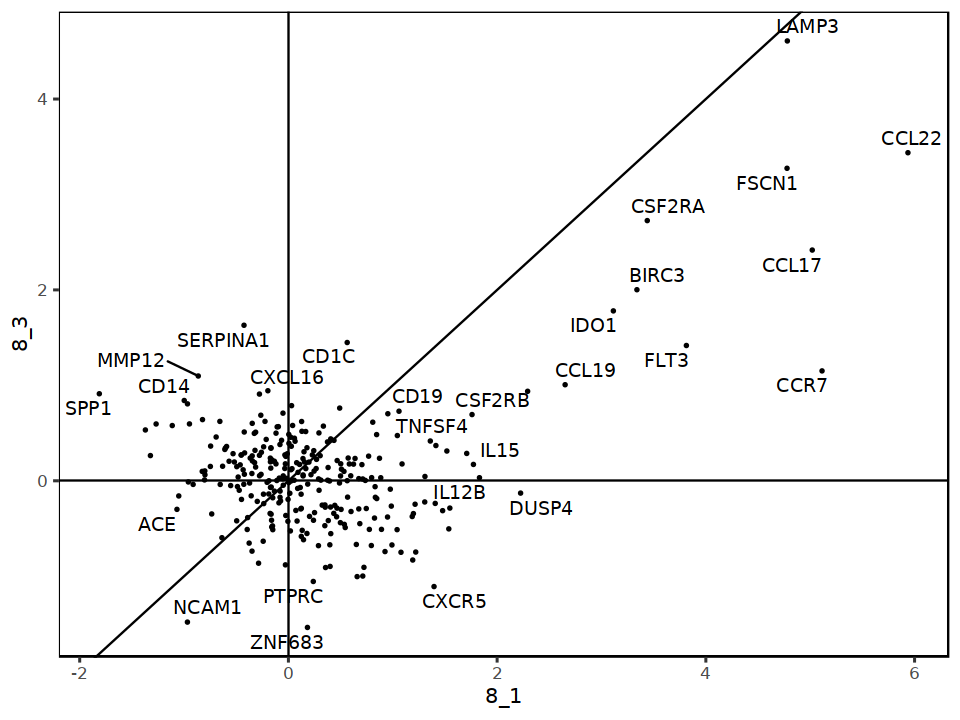

In [87]:
fig.size(6, 8)
markers %>% subset(cluster %in% c('8_1', '8_3')) %>% 
    dplyr::select(cluster, feature, SCORE = logFC) %>% 
    # dplyr::select(cluster, feature, zscore) %>% 
    tidyr::spread(cluster, SCORE) %>% 
    ggplot(aes(`8_1`, `8_3`)) + 
        geom_point(size = .5) + 
        geom_text_repel(aes(label = feature)) + 
        geom_hline(yintercept = 0) + 
        geom_vline(xintercept = 0) + 
        geom_abline() + 
        labs(x = 'logFC (8_1)', y = 'logFC (8_3)') + 
        NULL


In [34]:
sum(grepl('^3_', clusters))

[1] 35620

In [35]:
sum(grepl('^14_', clusters))

[1] 15870

In [138]:
meta_data %>% subset(grepl('LAMP3', label)) %>% with(table(hubType)) %>% prop.table()


hubType
  hybrid_hub   immune_hub immune_other        tumor     vascular 
   0.3408497    0.1175844    0.2529759    0.1578438    0.1307462 

In [139]:
meta_data %>% 
    cbind(CLUSTER = clusters) %>% 
    subset(CLUSTER == '8_1') %>% with(prop.table(table(hubType)))
meta_data %>% 
    cbind(CLUSTER = clusters) %>% 
    subset(CLUSTER == '8_3') %>% with(prop.table(table(hubType)))
# subset(grepl('LAMP3', label)) %>% with(table(hubType)) %>% prop.table()


hubType
  hybrid_hub   immune_hub immune_other        tumor     vascular 
  0.50215109   0.09722939   0.19204956   0.08621580   0.12235416 

hubType
  hybrid_hub   immune_hub immune_other        tumor     vascular 
   0.1335692    0.1437417    0.3312693    0.2498894    0.1415303 

In [141]:
markers %>% 
    subset(feature %in% c('CCL22', 'CCL17')) %>% 
    subset(fdr < .05)

cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8_3,CCL22,3.437199,0.4319382,7.957617,8.769221e-16,2.234245e-13
6_2,CCL22,2.734404,0.3758630,7.275003,1.732062e-13,3.520190e-11
8_3,CCL17,2.417492,0.4298196,5.624434,9.305886e-09,9.885044e-07
4_3,CCL17,1.758201,0.3514046,5.003351,2.817107e-07,2.186523e-05
8_1,CCL22,5.936530,1.2981497,4.573070,2.403147e-06,1.549775e-04
6_2,CCL17,1.669874,0.3779595,4.418130,4.977929e-06,2.981669e-04
8_5,CCL17,4.398739,1.0694377,4.113132,1.951631e-05,1.001742e-03
8_5,CCL22,3.746553,0.9764423,3.836943,6.228768e-05,2.761709e-03
8_1,CCL17,5.019625,1.3497879,3.718825,1.000760e-04,4.154276e-03


### Attach labels

In [3]:
## remove 17_5, 17_9, 17_8 as doublets
## remove 16_2, 16_3, 16_4 as doublets
## remove 12_2 as unmappable myeloid
## remove 12_5 as proliferating doublet
## justify 12 subclusters as proliferating
dict_subclust = tribble(
    ~label, ~cluster,
    ## B
    'B', "4_3", 

    ## T
    "CD4 T", c("4_2", "4_1", "4_4", "4_5", "4_6", "4_7"),  
    'CD8 T', c("7_3", "7_5", "12_3", "7_4", "7_1", "7_7"), 
    'TCF7+ CD8 T', c('7_2'), 
    'Treg', c('6_4', "6_6", "6_5", "6_1", "12_1", "6_3", "6_7", "6_2"), 
    'CXCL13+ CD8 T', c("7_6", "12_4"), 
    'CXCL13+ CD4 T', c("16_5", "16_1"), 
    
    ## ILC
    'ILC', c("10_3", "10_5", "10_2", "10_1", "10_6", "10_4"), 
    'NK',  "10_7", 
    
    ## MAC
    'PLA2G7+ CCL18+ Macrophage', c("17_6", "17_2", "17_4", "17_1", "17_7", "17_3"), 
    'SPP1+ Macrophage', c("3_10", "3_4", "14_3", "14_2", "3_5", "14_5", "14_4", "3_6", "3_3", "3_11", "3_1", "3_8", "3_7", "3_2", "14_6", "14_1", "3_9"), 
    'FOLR2+CD14+ Macrophage', c("5_5", "5_4", "5_9", "5_7", "5_6", "5_1", "5_8", "5_3", "5_2"), 
    # 'C1QC+ TSLP+ Macrophage', c("5_3", "5_2"),  ## don't gain anything with this division 
    'CXCL10+ Macrophage', c("11_4", "11_2", "11_5", "11_7", "11_8", "11_3", "11_6", "11_1"), 
    'MERTK+ Macrophage', c("2_4", "2_2", "2_3", "2_5", "2_7", "2_1", "2_6"), 
    'MARCO+ Macrophage', c("1_6", "1_3", "1_2", "1_4", "1_1", "1_7", "1_5"), 
    'FCN1+LYZ+ Macrophage', c("9_7", "9_2", "9_5", "9_1", "9_3", "9_6", "9_4"), 

    ## DC
    'LAMP3+CCL19+ mreg DC', c("8_1"), 
    'CD1C+ITGAX+ DC', c("8_4", "8_2"), 
    'LAMP3+CD1C+ DC', c("8_3"), 
    'FLT3+ DC', c("8_5", "8_6"), 
    
    ## Other myeloid
    'MMP1+SOX4+ Myeloid', c("15_4", "15_3", "15_2", "15_1", "15_5"), 
    'NCAM1+ S100B+ SEPP1+ Myeloid', c("13_6", "13_2", "13_1", "13_7", "13_4", "13_3", '13_5')
    
) 
dict_subclust


label,cluster
<chr>,<list>
B,4_3
CD4 T,"4_2, 4_1, 4_4, 4_5, 4_6, 4_7"
CD8 T,"7_3 , 7_5 , 12_3, 7_4 , 7_1 , 7_7"
TCF7+ CD8 T,7_2
Treg,"6_4 , 6_6 , 6_5 , 6_1 , 12_1, 6_3 , 6_7 , 6_2"
CXCL13+ CD8 T,"7_6 , 12_4"
CXCL13+ CD4 T,"16_5, 16_1"
ILC,"10_3, 10_5, 10_2, 10_1, 10_6, 10_4"
NK,10_7


In [4]:
meta_data$label = tibble(cluster = as.character(clusters)) %>% 
    left_join(tidyr::unnest(dict_subclust, 'cluster')) %>% 
    with(label)


Joining, by = "cluster"


In [11]:
.x = meta_data %>% 
    with(table(label, hubType)) %>% 
    prop.table(1)
.x[order(.x[, 'hybrid_hub']), 'hybrid_hub', drop = FALSE]
.x[order(.x[, 'immune_hub']), 'immune_hub', drop = FALSE]


                              hubType
label                          hybrid_hub
  SPP1+ Macrophage             0.04224121
  MARCO+ Macrophage            0.05628722
  MMP1+SOX4+ Myeloid           0.06205830
  FOLR2+CD14+ Macrophage       0.11414954
  NCAM1+ S100B+ SEPP1+ Myeloid 0.12367740
  LAMP3+CD1C+ DC               0.13356922
  MERTK+ Macrophage            0.13479890
  FCN1+LYZ+ Macrophage         0.17173834
  CD1C+ITGAX+ DC               0.18988710
  ILC                          0.23492815
  CXCL13+ CD8 T                0.24271523
  CXCL10+ Macrophage           0.24508010
  PLA2G7+ CCL18+ Macrophage    0.25310372
  NK                           0.25997719
  FLT3+ DC                     0.26525889
  CD8 T                        0.28332604
  Treg                         0.30455592
  CXCL13+ CD4 T                0.37855179
  TCF7+ CD8 T                  0.46768848
  LAMP3+CCL19+ mreg DC         0.50215109
  CD4 T                        0.50862171
  B                            0.54886

                              hubType
label                          immune_hub
  CD4 T                        0.04804376
  B                            0.06135186
  SPP1+ Macrophage             0.07834531
  TCF7+ CD8 T                  0.08547363
  LAMP3+CCL19+ mreg DC         0.09722939
  FCN1+LYZ+ Macrophage         0.11156159
  Treg                         0.13721619
  CXCL13+ CD4 T                0.13863428
  LAMP3+CD1C+ DC               0.14374171
  NK                           0.14481186
  FLT3+ DC                     0.14550188
  CD1C+ITGAX+ DC               0.14989190
  NCAM1+ S100B+ SEPP1+ Myeloid 0.15036445
  CD8 T                        0.15737418
  MERTK+ Macrophage            0.16767424
  ILC                          0.17139239
  FOLR2+CD14+ Macrophage       0.17529746
  CXCL13+ CD8 T                0.18377483
  MMP1+SOX4+ Myeloid           0.18617491
  PLA2G7+ CCL18+ Macrophage    0.19943933
  CXCL10+ Macrophage           0.23659848
  MARCO+ Macrophage            0.27132

Warning message:
“Removed 1 rows containing missing values (`geom_label()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”


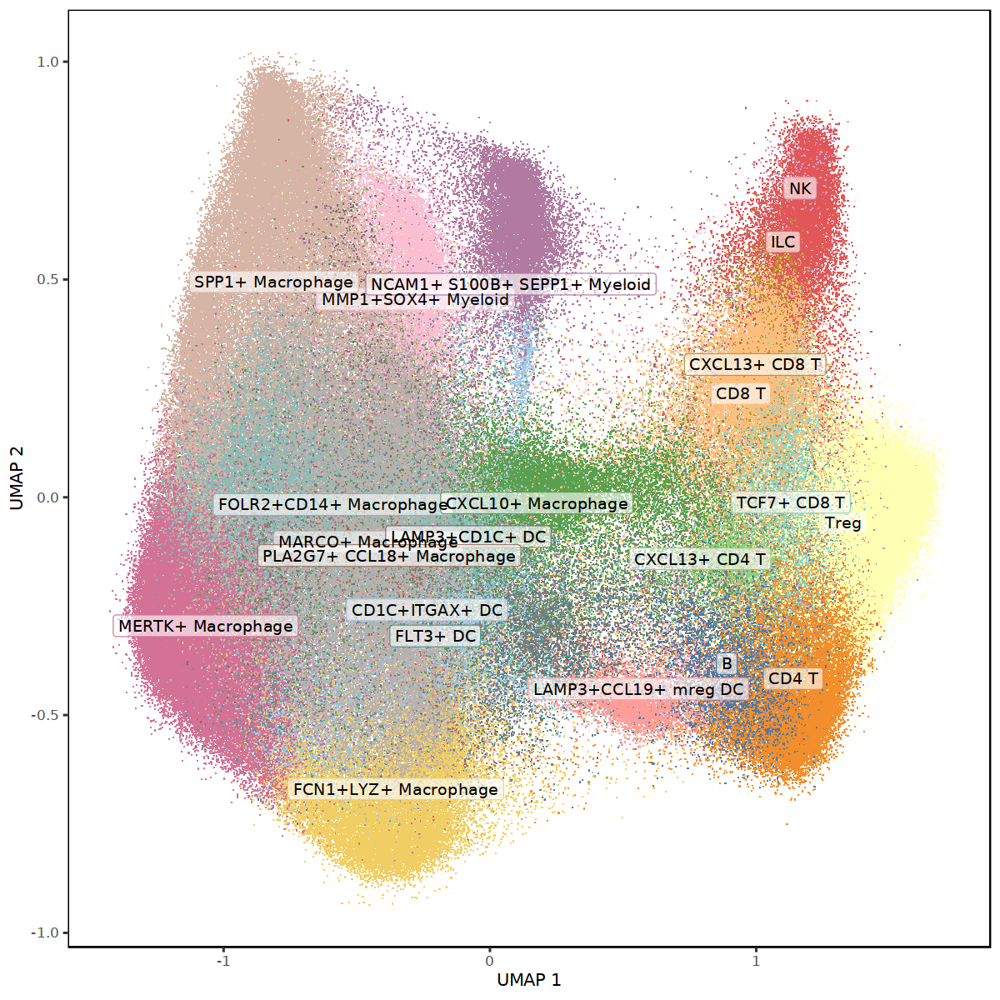

In [31]:
fig.size(10, 10)
do_scatter(U2$embedding, meta_data, 'label')


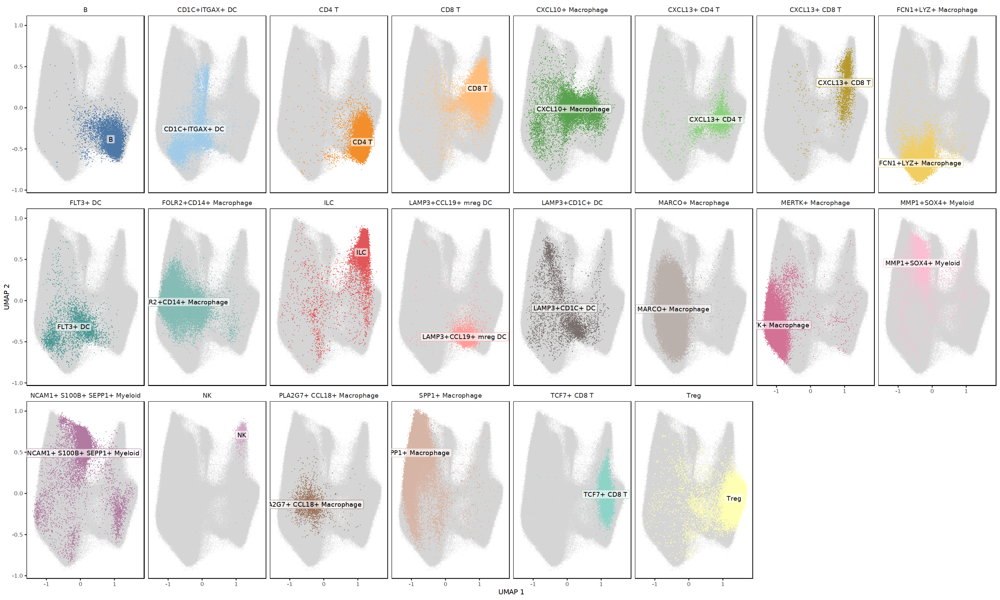

In [7]:
fig.size(15, 25)
i = which(!is.na(meta_data$label))
do_scatter(U2$embedding[i, ], meta_data[i, ], 'label', quo(label), nrow = 3)


In [9]:
table(meta_data$label)


                           B               CD1C+ITGAX+ DC 
                        8492                         8326 
                       CD4 T                        CD8 T 
                       25227                        22850 
          CXCL10+ Macrophage                CXCL13+ CD4 T 
                       18039                         4364 
               CXCL13+ CD8 T         FCN1+LYZ+ Macrophage 
                        3020                        21952 
                    FLT3+ DC       FOLR2+CD14+ Macrophage 
                        3457                        29584 
                         ILC         LAMP3+CCL19+ mreg DC 
                       18163                         5811 
              LAMP3+CD1C+ DC            MARCO+ Macrophage 
                        4522                        57935 
           MERTK+ Macrophage           MMP1+SOX4+ Myeloid 
                       40030                        13584 
NCAM1+ S100B+ SEPP1+ Myeloid                           

### Re-estimate cluster markers

In [15]:
## Only using genes used for immune cell analysis 
system.time({
    markers_final <- get_markers(counts, meta_data, 'label')    
})


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"


   user  system elapsed 
384.544  44.511  28.398 

In [20]:
any(is.na(markers_final$cluster))

[1] FALSE

In [21]:
str(markers_final)

tibble [6,446 × 7] (S3: tbl_df/tbl/data.frame)
 $ cluster: chr [1:6446] "Treg" "Treg" "LAMP3+CCL19+ mreg DC" "LAMP3+CCL19+ mreg DC" ...
 $ feature: chr [1:6446] "FOXP3" "CCR8" "CCL22" "IL15" ...
 $ logFC  : num [1:6446] 5.46 4.14 5.48 1.82 4.4 ...
 $ SD     : num [1:6446] 0.482 0.404 0.542 0.183 0.455 ...
 $ zscore : num [1:6446] 11.34 10.25 10.11 9.96 9.66 ...
 $ pvalue : num [1:6446] 4.08e-30 6.02e-25 2.57e-24 1.10e-23 2.15e-22 ...
 $ fdr    : num [1:6446] 2.63e-26 1.94e-21 5.53e-21 1.77e-20 2.77e-19 ...


In [22]:
data.table(markers_final)[, sum(fdr < .2 & logFC > 0), by = cluster]


cluster,V1
<chr>,<int>
Treg,86
LAMP3+CCL19+ mreg DC,41
CXCL13+ CD8 T,73
CD1C+ITGAX+ DC,41
NCAM1+ S100B+ SEPP1+ Myeloid,16
PLA2G7+ CCL18+ Macrophage,24
FCN1+LYZ+ Macrophage,24
MMP1+SOX4+ Myeloid,26
SPP1+ Macrophage,21


In [28]:
tt(markers_final, logFC_min = 0, fdr_max = .2) 


Warning message in tt(markers_final, logFC_min = 0, fdr_max = 0.2):
“NAs introduced by coercion”


B,MS4A1,CD19,SELL,S1PR1,KLF2,CD79A,CCL19,IL7R,EPHA4,CXCR4
CD1C+ITGAX+ DC,S100B,LST1,CD1C,CSF2RA,CSF3R,ITGAX,CSF2RB,TNF,CCL17,ENTPD1
CD4 T,CCR7,TNFRSF25,S1PR1,TCF7,SELL,KLF2,CD40LG,IL7R,CD247,LEF1
CD8 T,LAG3,GZMA,CD8A,GZMK,EOMES,PRF1,CCR5,CCL4,CXCR6,FASLG
CXCL10+ Macrophage,CXCL10,GBP1,CXCL11,IDO1,CCL8,GBP4,CXCL9,ISG15,SOD2,CD40
CXCL13+ CD4 T,CXCL13,CTLA4,RORA,TNFRSF25,BTLA,RBPJ,STING1,CD40LG,ZBED2,PRDM1
CXCL13+ CD8 T,ZNF683,ITGAE,MKI67,CXCL13,GNLY,TOP2A,GZMA,FASLG,PCNA,TOX
FCN1+LYZ+ Macrophage,FCN1,CSF3R,CA1,LYZ,S100A8,S100A9,LST1,FOS,IL2,CTSG
FLT3+ DC,CCL17,CSF2RA,CCL22,FSCN1,FLT3,CSF2RB,CD1C,TSLP,IL3RA,IRF8
FOLR2+CD14+ Macrophage,FOLR2,CD14,CCL13,IFNB1,PLTP,C1QC,CSF1R,TSLP,CD163,CCR6
ILC,GNLY,ZNF683,ITGAE,IL2RB,KIR2DL4,TRDC,FASLG,GZMA,CCL5,PRF1


## Balanced UMAP 

Take balanced sample from each population and project the rest. 


In [77]:
i = split(seq_len(nrow(meta_data)), meta_data$label) %>% 
    map(function(x) sample(x, min(5000, length(x)))) %>% 
    reduce(c) 

system.time({
    U_balanced <- uwot::umap(
        t(harmony_res$Z_cos[, i]), min_dist = 0.01, spread = 0.22, 
        ret_extra = c('fgraph', 'model'),
        approx_pow = TRUE, pcg_rand = FALSE, n_sgd_threads = 20
    )    
})


   user  system elapsed 
105.368  13.533  20.049 

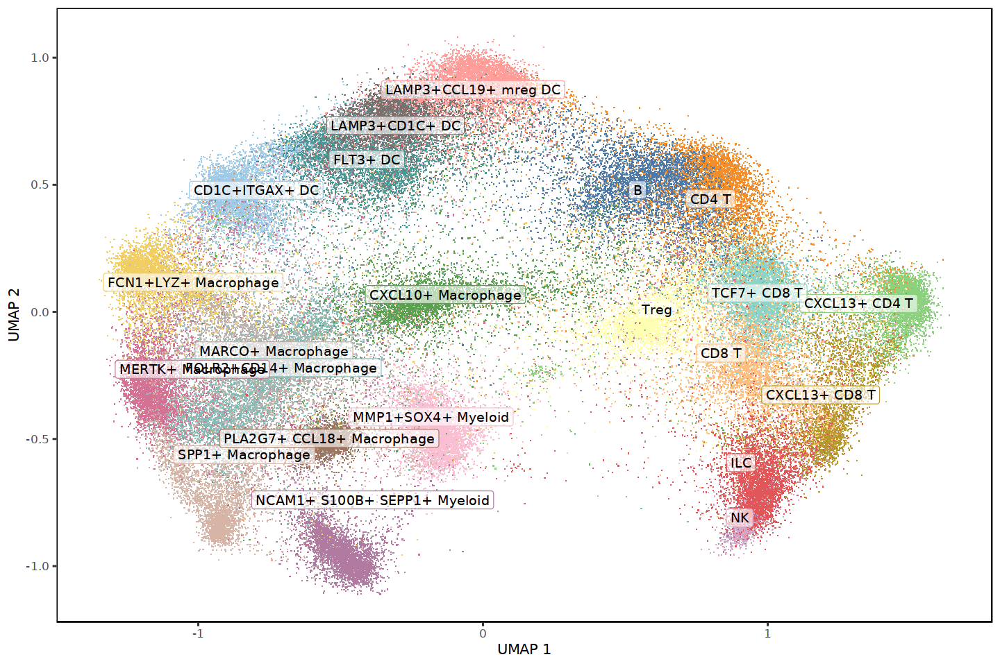

In [78]:
fig.size(8, 12)
do_scatter(U_balanced$embedding, meta_data[i, ], 'label')


In [79]:
system.time({
    U3 = uwot::umap_transform(t(harmony_res$Z_cos), U_balanced)    
})


   user  system elapsed 
132.144   1.057  42.720 

Warning message:
“Removed 1 rows containing missing values (`geom_label()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text()`).”


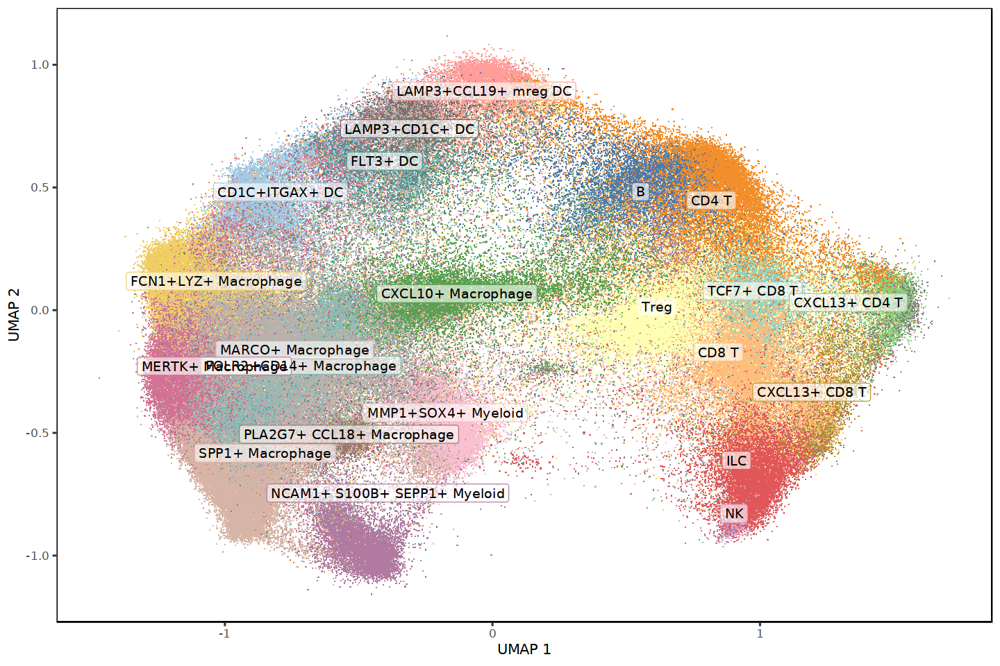

In [80]:
fig.size(8, 12)
do_scatter(U3, meta_data, 'label')


In [82]:
U3 = data.frame(U3)
colnames(U3) = c('UMAP1', 'UMAP2')
rownames(U3) = meta_data$cell

## Cache

In [58]:
fwrite(meta_data, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/meta_data.csv')
writeMM_fast(counts_all, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/counts_all.mtx')
writeLines(rownames(counts_all), '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/genes_all.txt')
writeLines(genes_keep, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/genes_keep.txt')
# writeLines(genes_remove, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/genes_remove.txt')

saveRDS(pca_res, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/pca_res.rds')
saveRDS(harmony_res$Z_corr, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/Z_corr.rds')
saveRDS(harmony_res$Z_cos, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/Z_cos.rds')
saveRDS(harmony_res$R, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/R.rds')
saveRDS(harmony_res$objective_kmeans, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/objective_kmeans.rds')
saveRDS(U2, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/U2.rds')


# saveRDS(U, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/U.rds')
# fwrite(clusters, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/clusters.csv')
fwrite(markers_final, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/final_markers.csv')  


In [83]:
saveRDS(U3, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/U3.rds')


In [147]:
## The intermediate results 
list(clusters = clusters, markers = markers, dict_subclust = dict_subclust) %>% 
    saveRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/results_immune_subcluster.rds')


In [ ]:
# saveRDS(snn_pruned, '/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/snn_pruned.rds')


In [3]:
meta_data <- fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/meta_data.csv')
meta_data$cell <- as.character(meta_data$cell)

counts_all <- readMM_fast('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/counts_all.mtx')
rownames(counts_all) <- readLines('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/genes_all.txt')
colnames(counts_all) <- meta_data$cell

genes_keep = readLines('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/genes_keep.txt')
counts <- counts_all[genes_keep, ]

pca_res = readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/pca_res.rds')
harmony_res = list(
    Z_corr = readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/Z_corr.rds'),
    Z_cos = readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/Z_cos.rds'),
    R = readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/R.rds'),
    objective_kmeans = readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/objective_kmeans.rds')
)


# clusters <- fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/clusters.csv')
U2 <- readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/U2.rds')
# clusters <- map(clusters, function(x) x = factor(x, unique(as.integer(x)))) %>% bind_cols()     
# markers <- fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/cells_immune/markers_initial_clusters.csv')

res = readRDS('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/lung_n4/results_immune_subcluster.rds')
clusters = res$clusters
markers = res$markers
dict_subclust = res$dict_subclust
    


## Revision: subtype CD4 and CD8


In [4]:
i = which(meta_data$label == 'TCF7+ CD8 T')
y = meta_data$label
y[i] = do_leiden_one(U2$fgraph[i, i], .5, 10)


In [5]:
m = wilcoxauc(normalizeData(counts, median(colSums(counts)), 'log'), y)

In [6]:
m %>% filter(feature == 'PDCD1') %>% arrange(-logFC) %>% filter(padj < .05 & logFC > 0)

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PDCD1,3,0.06761636,0.051623855,238374025,0.5289162,4.219418e-30,2.630403e-29,8.589512,2.908292
PDCD1,CXCL13+ CD8 T,0.06030376,0.044500433,655130130,0.5348702,1.070887e-113,1.845706e-112,9.801325,2.872458
PDCD1,8,0.04484343,0.028728067,50858452,0.5189350,4.997853e-04,1.978880e-03,6.666667,2.921470
PDCD1,CXCL13+ CD4 T,0.04002549,0.024151195,911241980,0.5165570,3.785641e-38,2.464873e-37,6.164070,2.888688
PDCD1,CD8 T,0.03259134,0.017434069,4513897742,0.5121110,5.914167e-99,1.863281e-98,5.185996,2.789660
PDCD1,SPP1+ Macrophage,0.02979787,0.015636038,9320878976,0.5069170,6.129314e-68,1.360522e-67,4.101767,2.753804
PDCD1,ILC,0.02065224,0.004730267,3564346635,0.5026270,3.991341e-05,5.649580e-05,3.413533,2.900882
PDCD1,Treg,0.01842011,0.002491727,6296576628,0.5020610,1.819568e-05,2.434399e-05,3.299530,2.890180


In [7]:
meta_data$label[which(y %in% c(3, 8))] = 'TCF7+PD1+ CD8 T'

In [8]:
i = which(meta_data$label == 'CD4 T')
y = meta_data$label
y[i] = do_leiden_one(U2$fgraph[i, i], .5, 10)


In [9]:
m = wilcoxauc(normalizeData(counts, median(colSums(counts)), 'log'), y, groups_use = grep('^\\d+$', unique(y), value = TRUE))
# m = wilcoxauc(normalizeData(counts, median(colSums(counts)), 'log'), y)


In [10]:
m %>% filter(feature == 'TCF7') %>% arrange(-logFC)# %>% filter(pval < .01)

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TCF7,1,0.05589155,0.023121515,78504788,0.5167121,5.038966e-27,5.905668e-26,8.202496,4.865607
TCF7,2,0.03802972,-0.005887848,71149614,0.4936580,6.924689e-05,2.254371e-04,5.329369,6.631074
TCF7,6,0.03455619,-0.007381435,2601625,0.4999326,9.935936e-01,9.992335e-01,6.250000,6.179304
TCF7,5,0.03314571,-0.008829758,3485189,0.4954430,5.276481e-01,7.847761e-01,5.319149,6.189617
TCF7,4,0.03090671,-0.011420503,11964416,0.4962256,3.327828e-01,4.949510e-01,5.527638,6.206669
TCF7,3,0.02395651,-0.022418762,49535990,0.4852890,8.032077e-15,7.131511e-14,3.852232,6.764195


In [11]:
meta_data$label[which(y %in% c('1'))] = 'TCF7+ CD4 T'


In [13]:
table(meta_data$label)


                                                        B 
                       10693                         8492 
              CD1C+ITGAX+ DC                        CD4 T 
                        8326                        15291 
                       CD8 T           CXCL10+ Macrophage 
                       22850                        18039 
               CXCL13+ CD4 T                CXCL13+ CD8 T 
                        4364                         3020 
        FCN1+LYZ+ Macrophage                     FLT3+ DC 
                       21952                         3457 
      FOLR2+CD14+ Macrophage                          ILC 
                       29584                        18163 
        LAMP3+CCL19+ mreg DC               LAMP3+CD1C+ DC 
                        5811                         4522 
           MARCO+ Macrophage            MERTK+ Macrophage 
                       57935                        40030 
          MMP1+SOX4+ Myeloid NCAM1+ S100B+ SEPP1+ Myelo